In [18]:
# first we import all relevant packages
from bulk import * # bulk.py stores a lot of my personal functions, i.e. for reading from the .data files and such
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import pynbody
from scipy import stats
from scipy.stats import binned_statistic
import scipy
from scipy import interpolate

pynbody.config['halo-class-priority'] =  [pynbody.halo.ahf.AHFCatalogue,
                                          pynbody.halo.GrpCatalogue,
                                          pynbody.halo.AmigaGrpCatalogue,
                                          pynbody.halo.legacy.RockstarIntermediateCatalogue,
                                          pynbody.halo.rockstar.RockstarCatalogue,
                                          pynbody.halo.subfind.SubfindCatalogue, pynbody.halo.hop.HOPCatalogue]


In [2]:
# we set the global matplotlib parameters so the fonts are all consistent and serif 
mpl.rc('font',**{'family':'serif','monospace':['Palatino']})
mpl.rc('text', usetex=True)
mpl.rcParams.update({'font.size': 9})

In [20]:
def read_timesteps(simname):
    '''Function to read in the timestep bulk-processing datafile (from /home/akinhol/Data/Timescales/DataFiles/{name}.data)'''
    data = []
    with open(f'/home/akinshol/Data/Timescales/DataFiles/{simname}.data','rb') as f:
        while True:
            try: 
                data.append(pickle.load(f))
            except EOFError:
                break
    
    data = pd.DataFrame(data)
    return data

def read_timescales():
    '''Function to read in the resulting data file which contains quenching and infall times'''
    data = []
    with open('/home/akinshol/Data/Timescales/QuenchingTimescales_sSFR_F19.data', 'rb') as f:
        while True:
            try:
                data.append(pickle.load(f,encoding='latin1'))
            except EOFError:
                break

    data = pd.DataFrame(data)
    return data

def read_z0(simname):
    '''Function to read in the data file which contains z=0 information for the various halos'''
    data = []
    with open('/home/akinshol/Data/DataFiles_Archive_20191129/'+ simname + '.data', 'rb') as f:
        while True:
            try:
                data.append(pickle.load(f,encoding='latin1'))
            except EOFError:
                break

    data1 = pd.DataFrame(data)
    return data1

In [189]:
def read_new_data():
    '''Function to read in the resulting data file which contains quenching and infall times'''
    data = []
    with open('/home/akinshol/Data/Timescales/QuenchingTimescales_sSFR_F19.data', 'rb') as f:
        while True:
            try:
                data.append(pickle.load(f,encoding='latin1'))
            except EOFError:
                break

    data = pd.DataFrame(data)
    return data

# Gas Density & Temperature Distributions over time

We plot the distribution of gas density and temperature for all gas particles in the halos over time. We do not weight the particles by their masses in this example because I couldn't figure out how to do it properly. 

**Recall the plot below of quenching timescale vs stellar mass.**

We will use this plot as a starting point, and choose our sample of galaxies from those in this plot, which is limited to: galaxies that experience infall and have more than 100 star particles. 

![alt text](plots/tq_mass_F19_sSFR.png "Title")

The halo IDs that we need are defined in the dictionary below (ruling out the small, early quenching halos)

In [8]:
haloids = {'h148': [2,3,5,6,9,10,11,13,14,21,27,28,32,36,37,45,68,80,163,278,283,329],
           'h229': [20, 22, 23, 27, 55, 73, 113],
           'h242': [10, 12, 24, 30, 41, 80, 439],
           'h329': [11, 33, 137]}

# All the halos

Running for simulation h148
1.2497059915406208


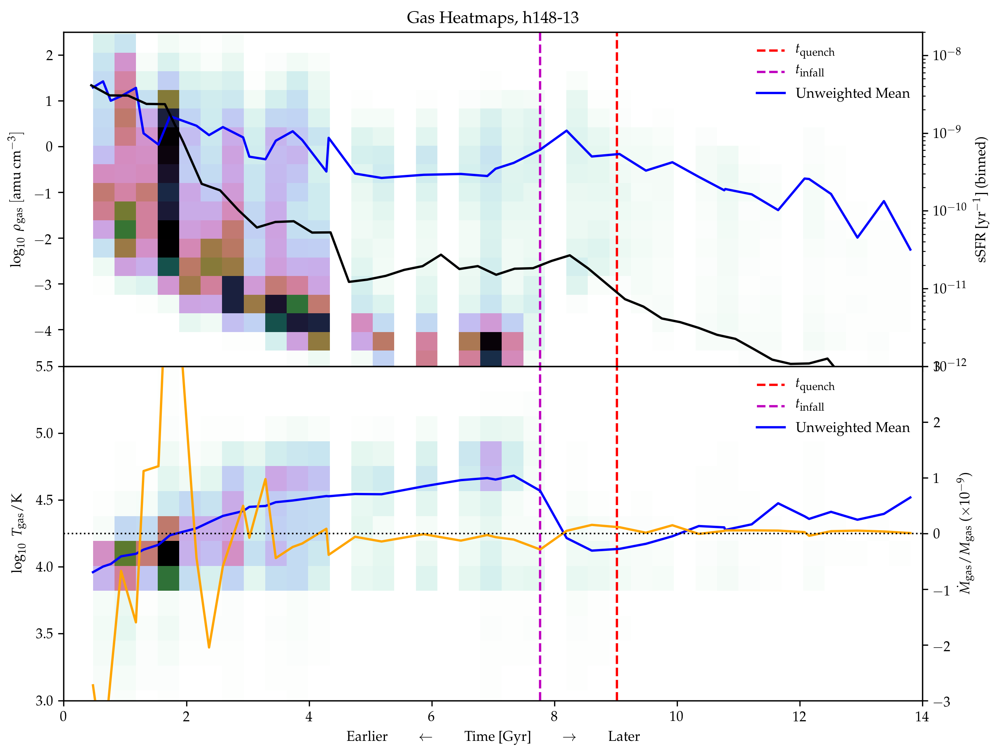

6.615051651809172
0.24724371941258383


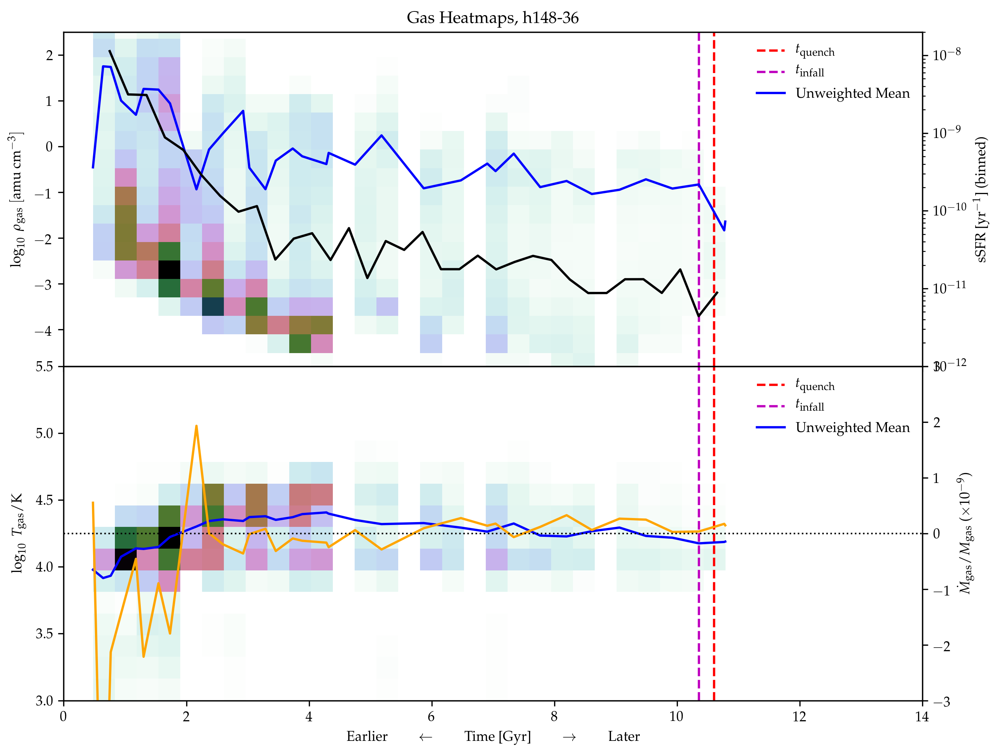

4.490310274759903
2.6484989413945
4.513424943223161
-0.4822273853689101
0.2568463501085372


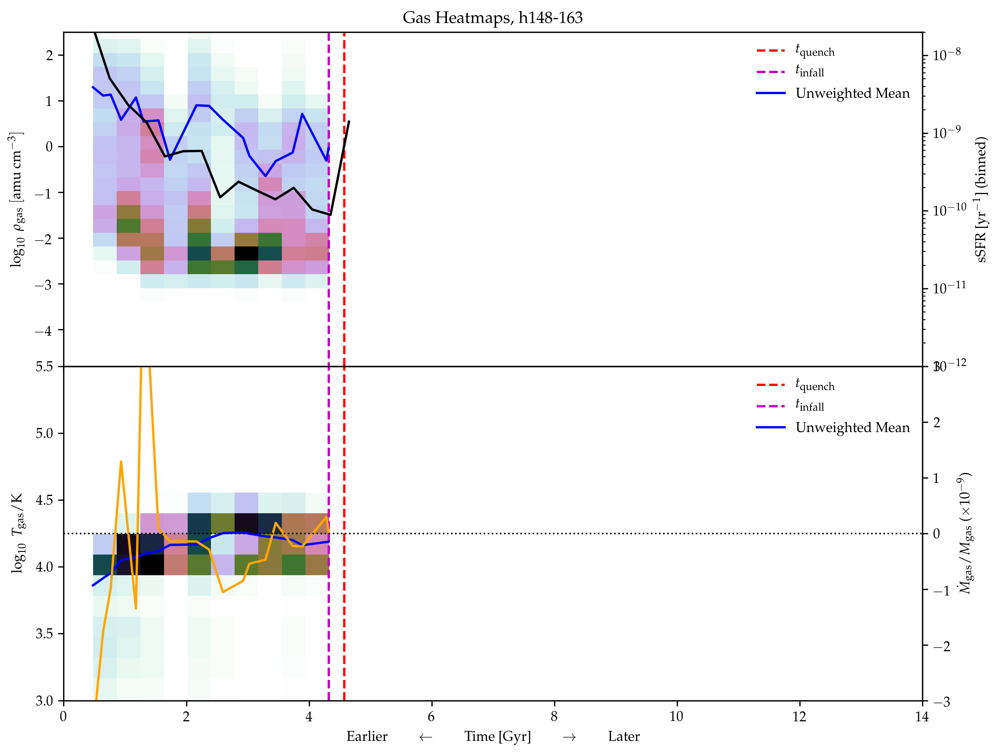

0.43347389052171614


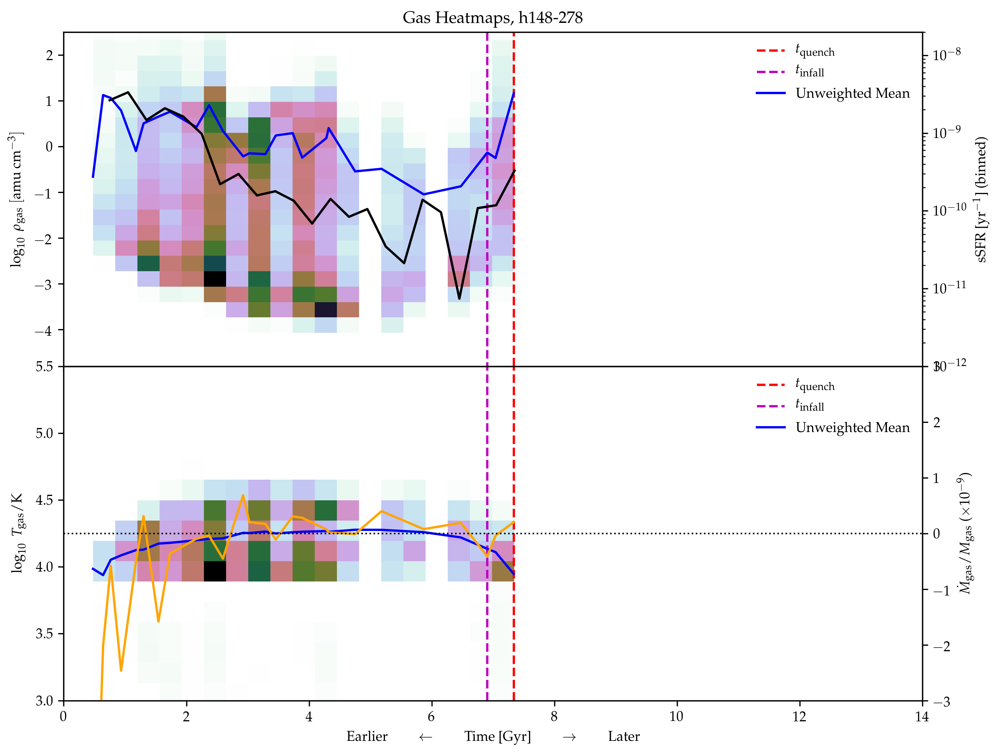

1.5355367789813776


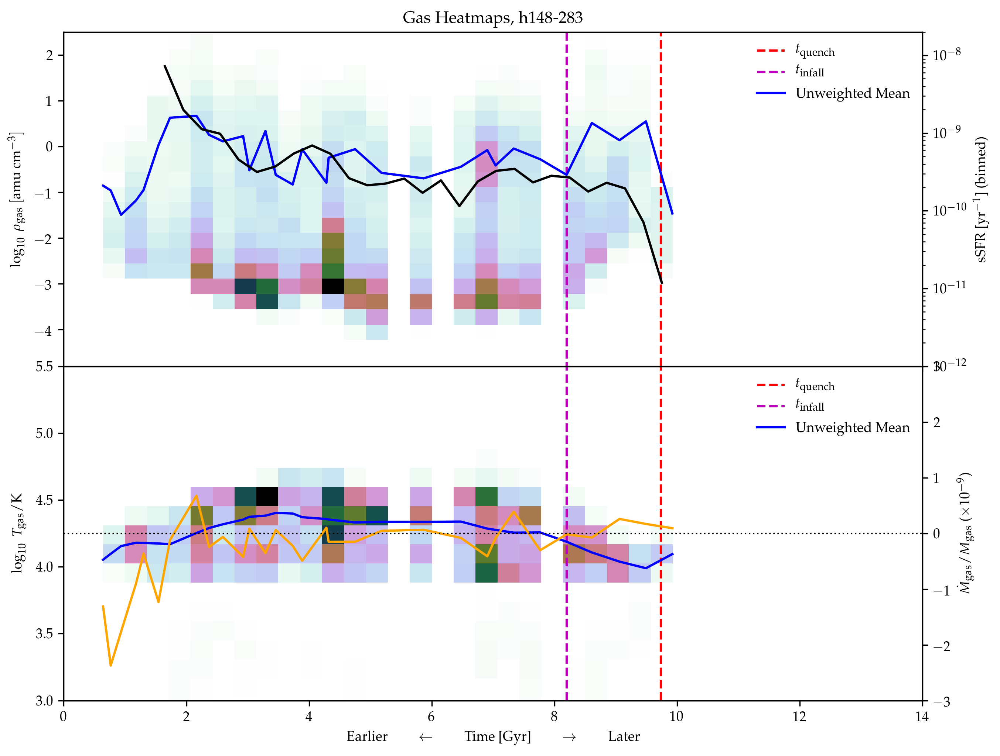

0.2536669899823565


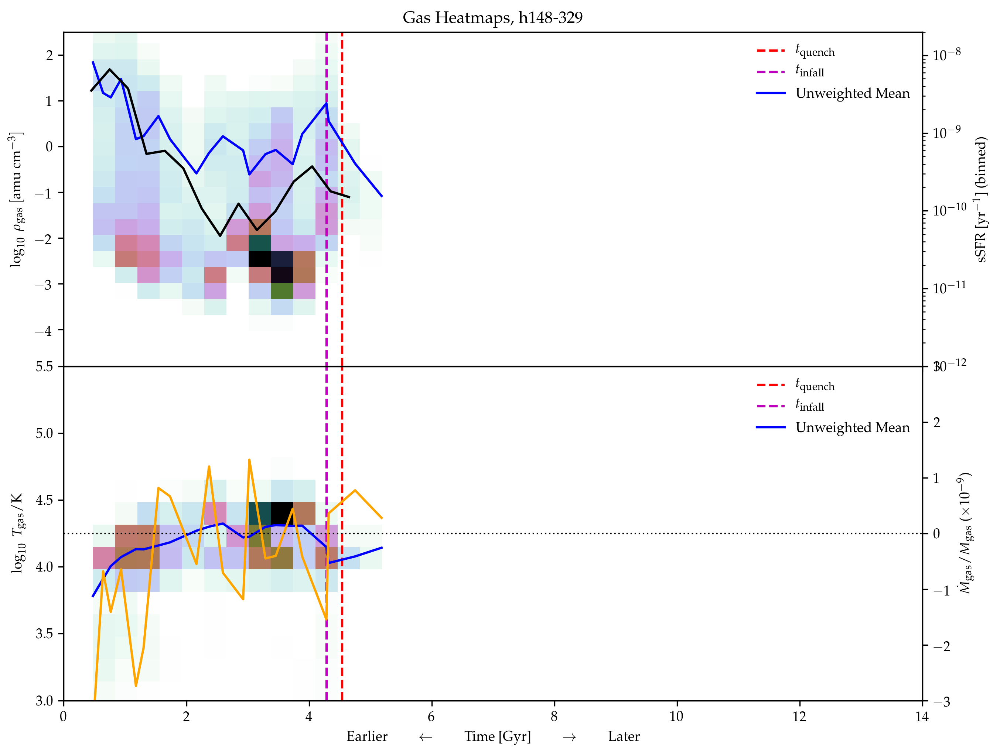

Running for simulation h229
5.0467953506167404
4.405515937285795
1.2086642826085372


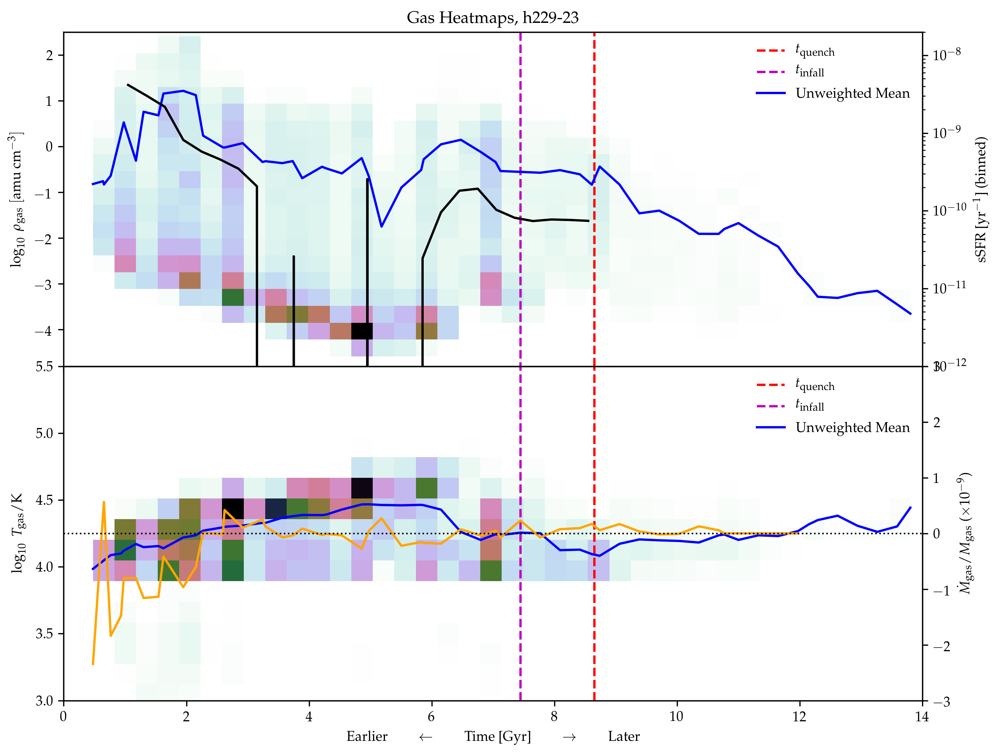

0.8157857691387891


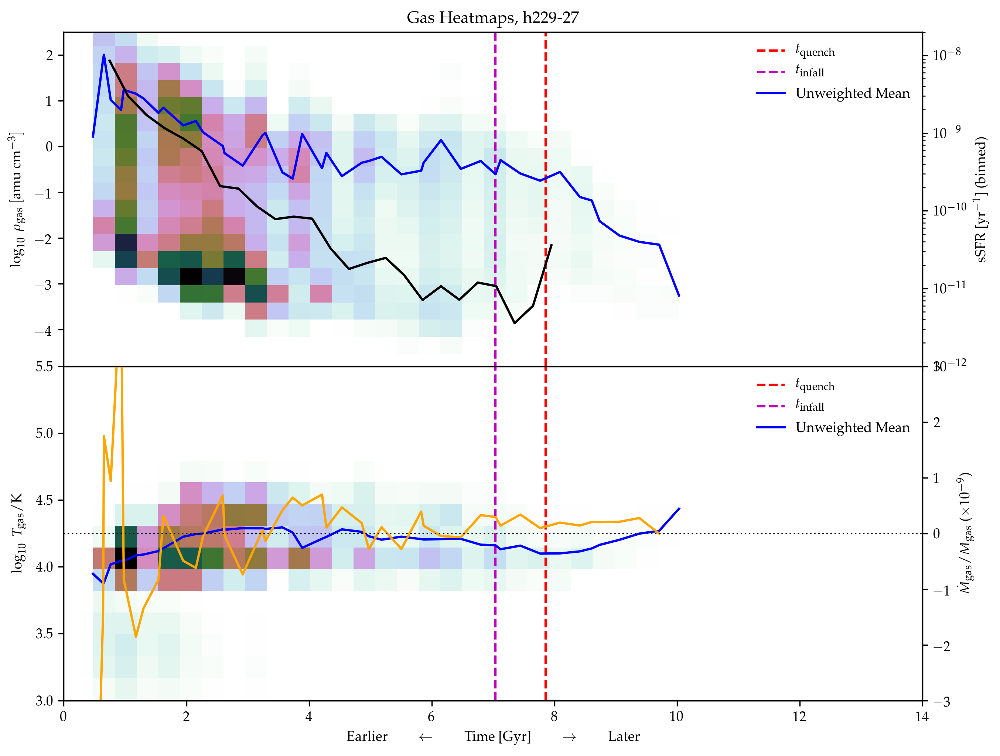

1.5814593738895653


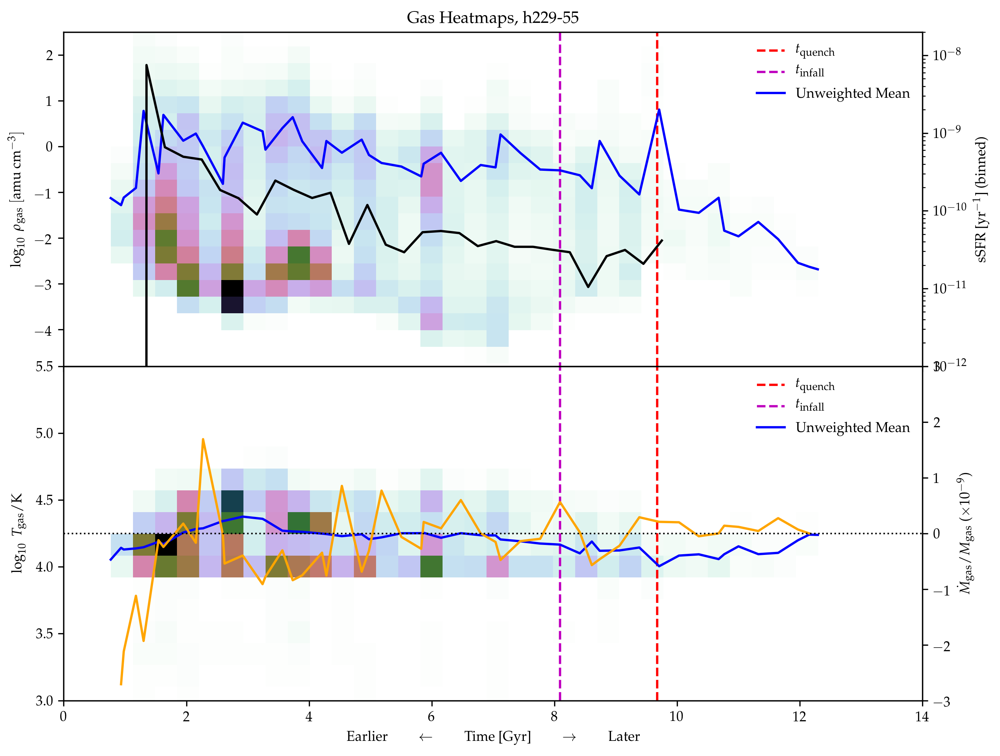

0.17155979397819898


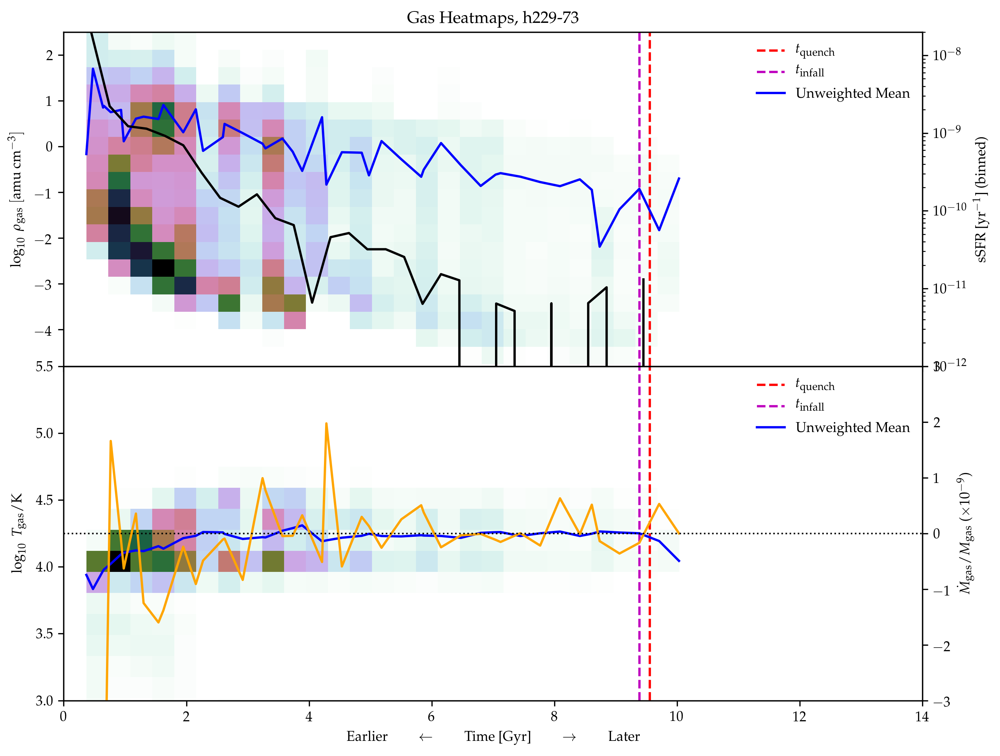

-4.501837181484307
Running for simulation h242
2.4620975676685237
-1.572714633756508
0.9660740322292121


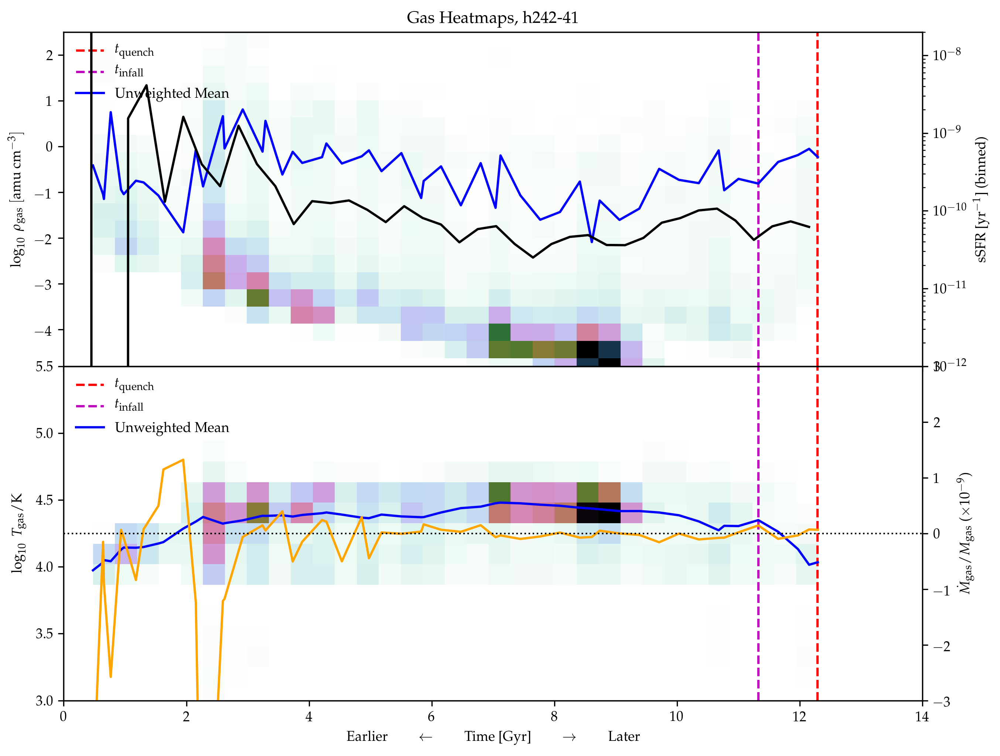

4.486484154813393
0.014378062984764739


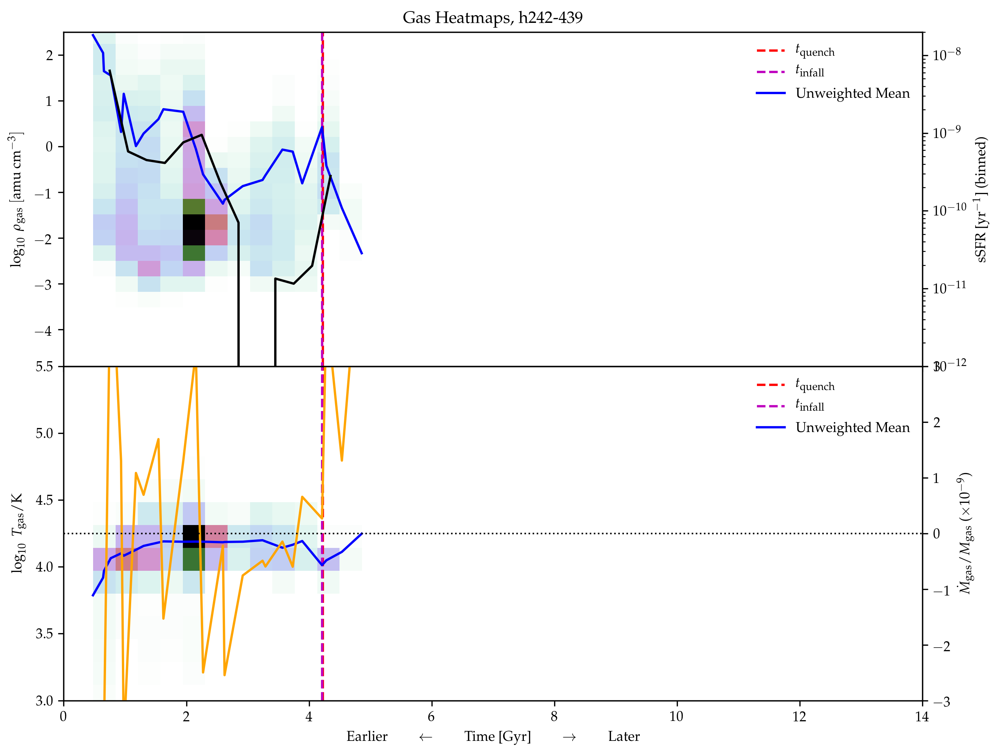

Running for simulation h329
0.2763510204308375


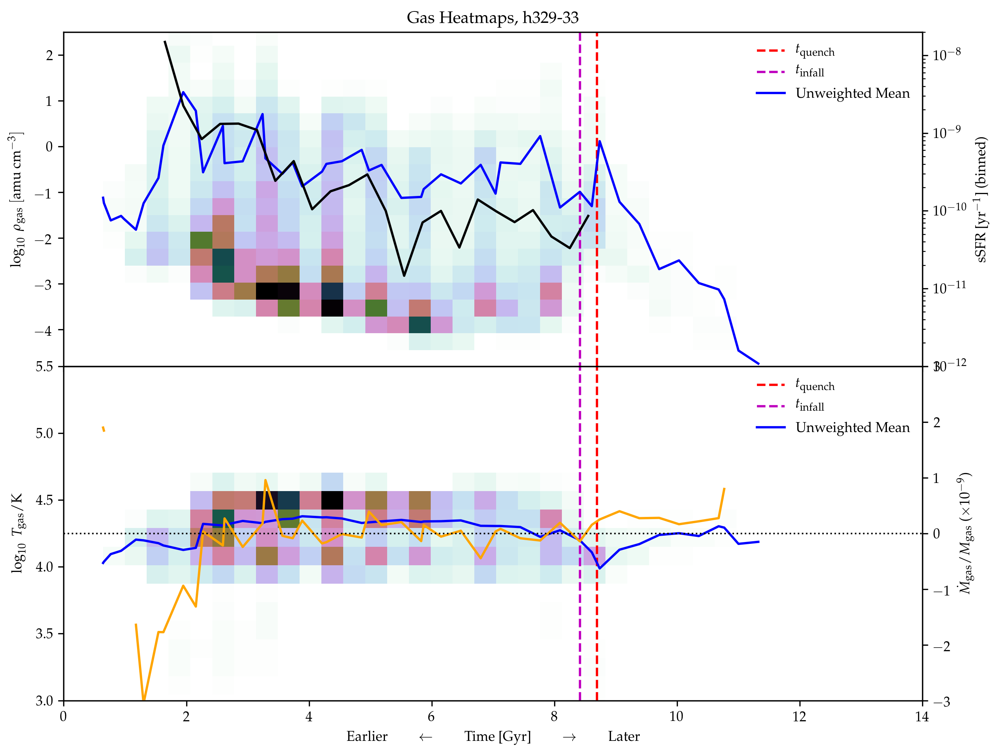

0.0474482502200253


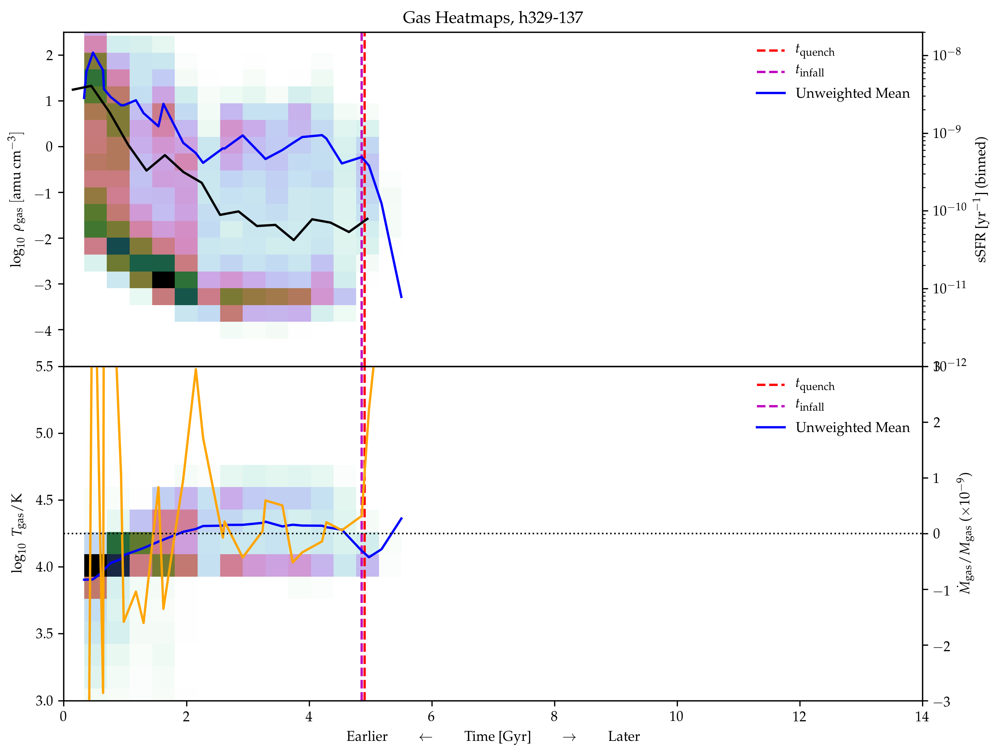

In [187]:
from scipy.stats import binned_statistic 

for sim in ['h148','h229','h242','h329']:
    data = read_timesteps(sim)
    z0 = read_z0(sim)
    print(f'Running for simulation {sim}')

    for haloid in haloids[sim]:
        d = data[data.z0haloid==haloid]

        # determine t_quench
        timescales = read_timescales()
        timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
        tquench_lbt = timescales.tquench.tolist()[0]
        tquench = 13.800797497330507 - tquench_lbt

        tinfall_lbt = timescales.tinfall.tolist()[0]
        tinfall = 13.800797497330507 - tinfall_lbt
        
        

        z = z0[z0.haloid == haloid]
        sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
        bincenters = 0.5*(binEdges[1:] + binEdges[:-1])
        
        mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
        mstar = mstar[np.argsort(time)]
        time = np.sort(time)
        
        s = interpolate.InterpolatedUnivariateSpline(time, mstar)
        mstar_interpolated = s(bincenters)
        
        sSFR = sfh/mstar_interpolated
        bins = np.arange(0,13.8,0.3)
        sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
        bincenters_binned = 0.5*(bins[1:] + bins[:-1])
        
        
        if np.isnan(tquench):
            continue
        else:
            timescale = tinfall_lbt - tquench_lbt
            
        print(timescale)
        
        if timescale < 0 or timescale > 2:
            continue
            
        outflow_disk = d.outflow_23
        inflow_disk = d.inflow_23
        net = outflow_disk + inflow_disk 
        net_norm = net / mgas

        # get distributions of gas density
        times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])
        
        for mgas in d.gas_mass:
            mgas_tot = np.append(mgas_tot, np.sum(mgas))
        mgas_tot = [np.sum(mgas) for mgas in d.gas_mass]
        
        for time, rho, mgas in zip(d.time, d.gas_rho, d.gas_mass):
            if len(rho) != 0:
                assert len(rho)==len(mgas)
                rhos = np.append(rhos, rho)
                weights = np.append(weights,mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(rho))
                
        rhos = rhos / 2.453e7
        rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho]) # convert to amu/cc

        xbins = int((np.max(times) - np.min(times))/14 * 40)

        rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
        rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        # get distributions of gas temperature
        times, temps, weights = np.array([]), np.array([]), np.array([])
        for time, temp, mgas in zip(d.time, d.gas_temp, d.gas_mass):
            if len(temp) != 0:
                temps = np.append(temps, temp)
                weights = np.append(weights, mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(temp))

        temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp]

        temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
        temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

        ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

        if not np.isnan(tquench):
            ax[0].plot([tquench,tquench], [-4.8,2.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[0].plot([tinfall,tinfall], [-4.9,2.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
        ax[0].set_xlim(0, 14)
        ax[0].set_ylim(-4.8,2.5)
        ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')
        
        ax0 = ax[0].twinx()
        ax0.plot(bincenters_binned, sSFR_binned, 'k-')
        ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
        ax0.semilogy()
        ax0.set_ylim(1e-12,2e-8)
        
        #ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[0].legend(frameon=False)

        if not np.isnan(tquench):
            ax[1].plot([tquench,tquench], [3,5.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[1].plot([tinfall,tinfall], [3,5.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[1].imshow(temps_heatmap.T, extent=temps_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
        ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
        ax[1].set_xlim(0,14)
        ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
        #ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[1].legend(frameon=False)
        ax[1].set_ylim(3,5.5)
        
        ax1 = ax[1].twinx()
        ax1.plot(d.time, net_norm*1e9, color='orange')
        #ax1.plot(d.time, np.abs(inflow_disk), color='orange')
        ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
        ax1.set_ylim(-3,3)
        ax1.plot([0,14], [0,0], 'k:', linewidth=1)

        plt.subplots_adjust(hspace=0.)
        plt.savefig(f'plots/GasPlots/{sim}_{haloid}.png',dpi=300)
        plt.show()

### 

# Quenching Timescale between 0 and 0.5 Gyr

Running for simulation h148
1.2497059915406208
6.615051651809172
0.24724371941258383


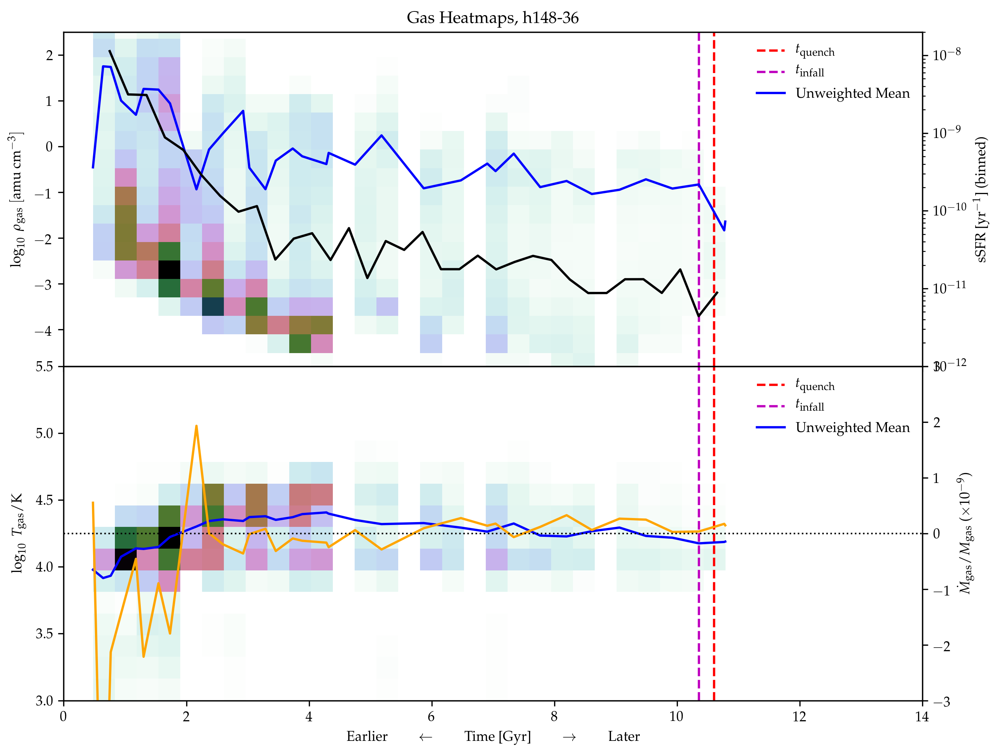

4.490310274759903
2.6484989413945
4.513424943223161
-0.4822273853689101
0.2568463501085372


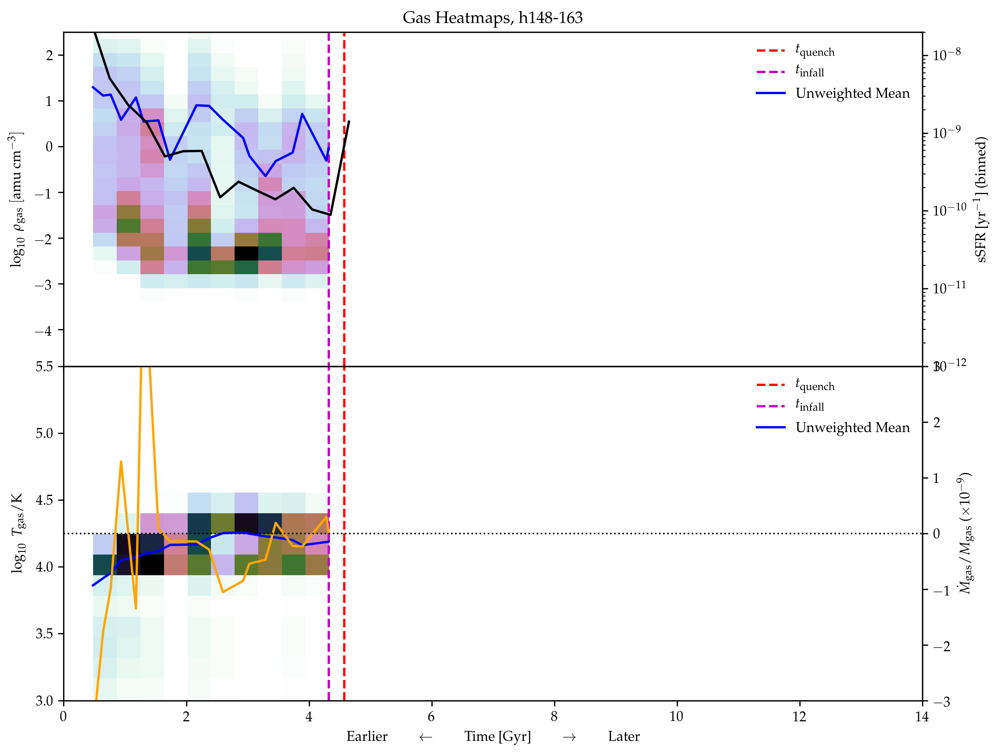

0.43347389052171614


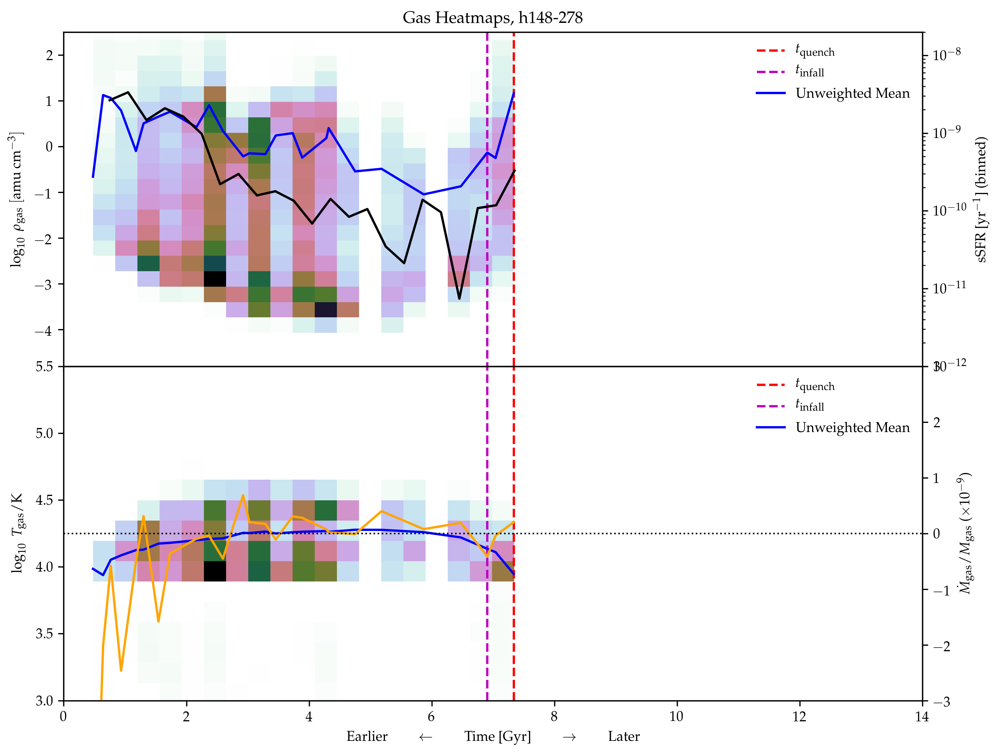

1.5355367789813776
0.2536669899823565


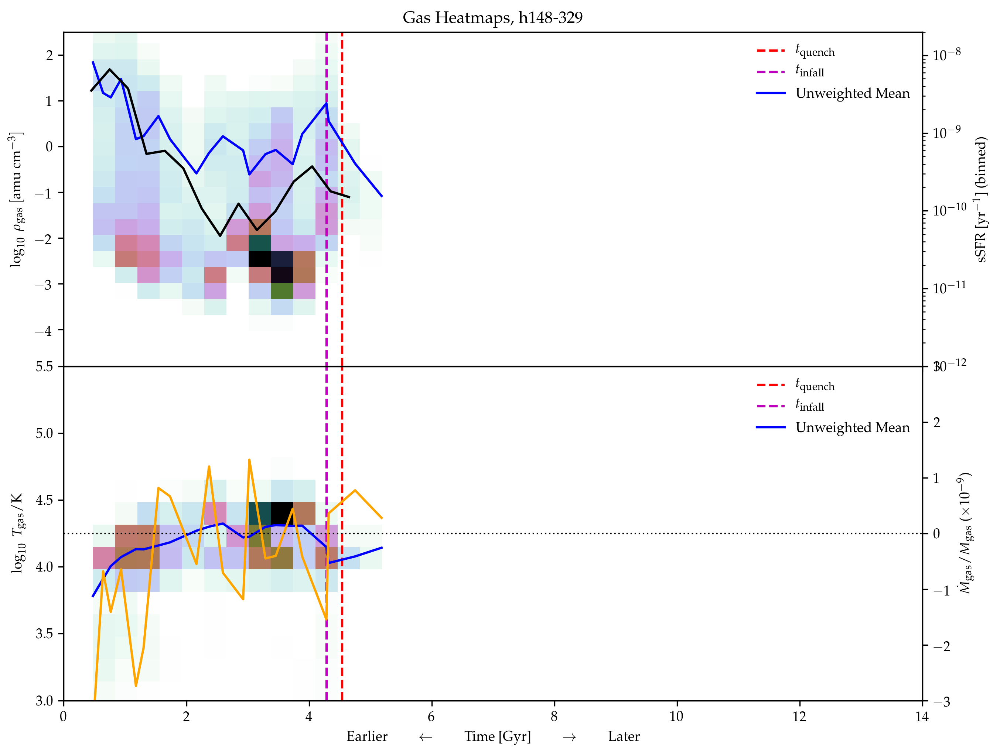

Running for simulation h229
5.0467953506167404
4.405515937285795
1.2086642826085372
0.8157857691387891
1.5814593738895653
0.17155979397819898


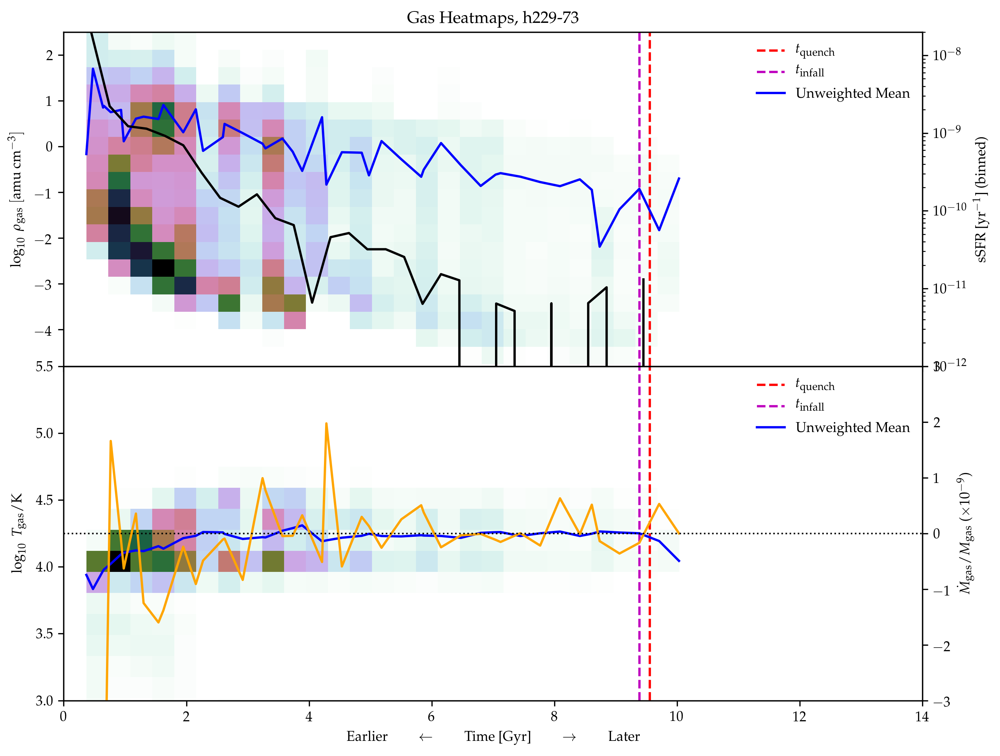

-4.501837181484307
Running for simulation h242
2.4620975676685237
-1.572714633756508
0.9660740322292121
4.486484154813393
0.014378062984764739


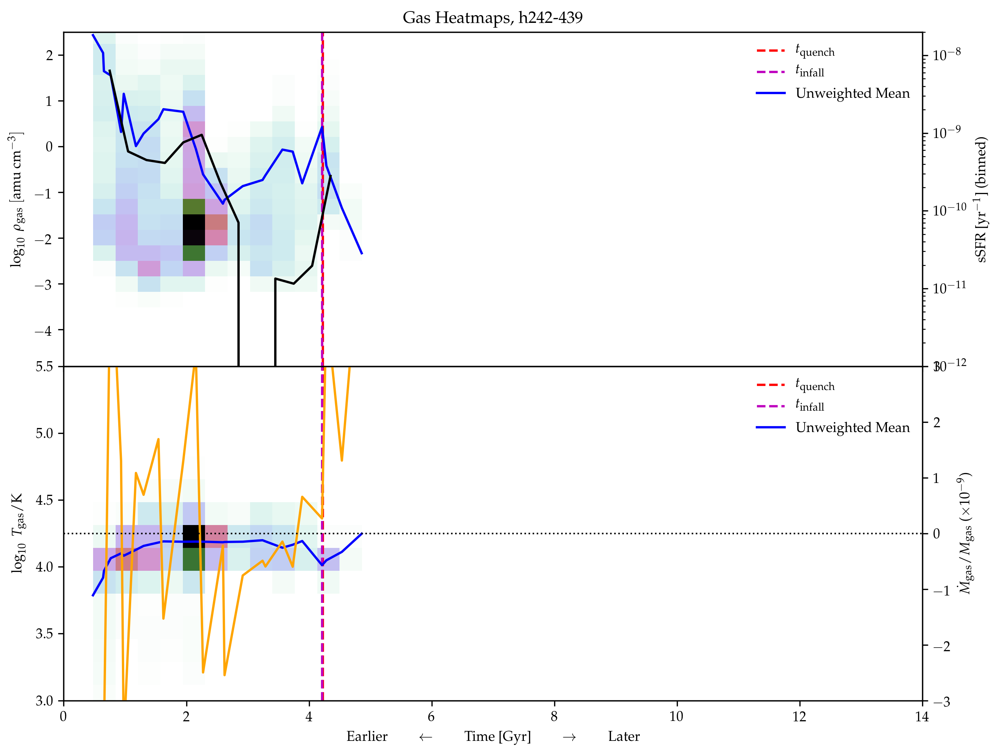

Running for simulation h329
0.2763510204308375


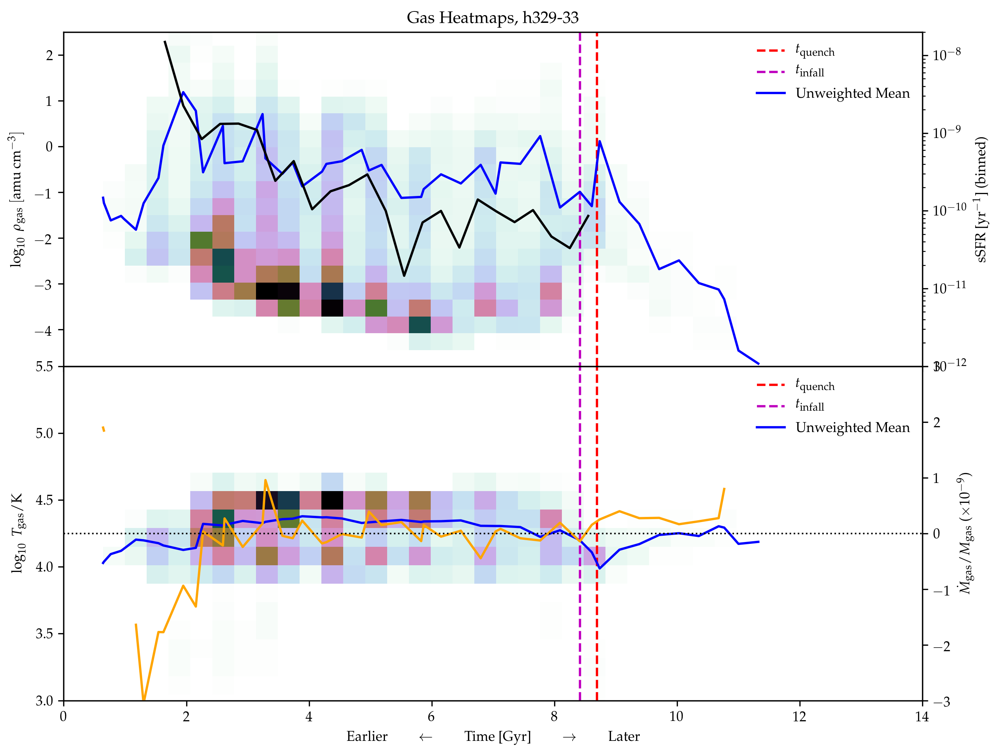

0.0474482502200253


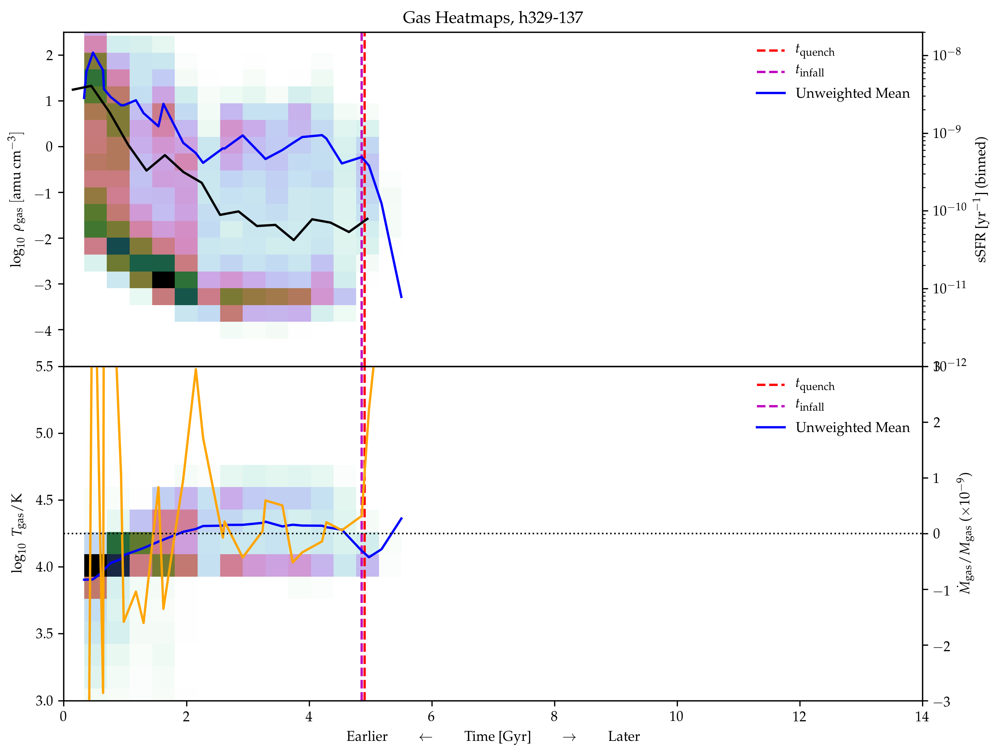

In [198]:
from scipy.stats import binned_statistic 

for sim in ['h148','h229','h242','h329']:
    data = read_timesteps(sim)
    z0 = read_z0(sim)
    print(f'Running for simulation {sim}')

    for haloid in haloids[sim]:
        d = data[data.z0haloid==haloid]

        # determine t_quench
        timescales = read_timescales()
        timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
        tquench_lbt = timescales.tquench.tolist()[0]
        tquench = 13.800797497330507 - tquench_lbt

        tinfall_lbt = timescales.tinfall.tolist()[0]
        tinfall = 13.800797497330507 - tinfall_lbt
        
        if np.isnan(tquench):
            continue
        else:
            timescale = tinfall_lbt - tquench_lbt
            
        print(timescale)
        
        if timescale < -0 or timescale > 0.5:
            continue
            

        z = z0[z0.haloid == haloid]
        sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
        bincenters = 0.5*(binEdges[1:] + binEdges[:-1])
        
        mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
        mstar = mstar[np.argsort(time)]
        time = np.sort(time)
        
        s = interpolate.InterpolatedUnivariateSpline(time, mstar)
        mstar_interpolated = s(bincenters)
        
        sSFR = sfh/mstar_interpolated
        bins = np.arange(0,13.8,0.3)
        sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
        bincenters_binned = 0.5*(bins[1:] + bins[:-1])
        
            
        outflow_disk = d.outflow_23
        inflow_disk = d.inflow_23
        net = outflow_disk + inflow_disk 
        net_norm = net / mgas

        # get distributions of gas density
        times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])
        
        for mgas in d.gas_mass:
            mgas_tot = np.append(mgas_tot, np.sum(mgas))
        mgas_tot = [np.sum(mgas) for mgas in d.gas_mass]
        
        for time, rho, mgas in zip(d.time, d.gas_rho, d.gas_mass):
            if len(rho) != 0:
                assert len(rho)==len(mgas)
                rhos = np.append(rhos, rho)
                weights = np.append(weights,mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(rho))
                
        rhos = rhos / 2.453e7
        rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho]) # convert to amu/cc

        xbins = int((np.max(times) - np.min(times))/14 * 40)

        rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
        rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        # get distributions of gas temperature
        times, temps, weights = np.array([]), np.array([]), np.array([])
        for time, temp, mgas in zip(d.time, d.gas_temp, d.gas_mass):
            if len(temp) != 0:
                temps = np.append(temps, temp)
                weights = np.append(weights, mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(temp))

        temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp]

        temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
        temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

        ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

        if not np.isnan(tquench):
            ax[0].plot([tquench,tquench], [-4.8,2.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[0].plot([tinfall,tinfall], [-4.9,2.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
        ax[0].set_xlim(0, 14)
        ax[0].set_ylim(-4.8,2.5)
        ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')
        
        ax0 = ax[0].twinx()
        ax0.plot(bincenters_binned, sSFR_binned, 'k-')
        ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
        ax0.semilogy()
        ax0.set_ylim(1e-12,2e-8)
        
        #ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[0].legend(frameon=False)

        if not np.isnan(tquench):
            ax[1].plot([tquench,tquench], [3,5.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[1].plot([tinfall,tinfall], [3,5.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[1].imshow(temps_heatmap.T, extent=temps_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
        ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
        ax[1].set_xlim(0,14)
        ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
        #ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[1].legend(frameon=False)
        ax[1].set_ylim(3,5.5)
        
        ax1 = ax[1].twinx()
        ax1.plot(d.time, net_norm*1e9, color='orange')
        #ax1.plot(d.time, np.abs(inflow_disk), color='orange')
        ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
        ax1.set_ylim(-3,3)
        ax1.plot([0,14], [0,0], 'k:', linewidth=1)

        plt.subplots_adjust(hspace=0.)
        plt.savefig(f'plots/GasPlots/Group1/{sim}_{haloid}.png',dpi=300)
        plt.show()

# Quenched, w/ Quenching Timescale between 0.5 and 2 Gyr

Running for simulation h148
1.2497059915406208


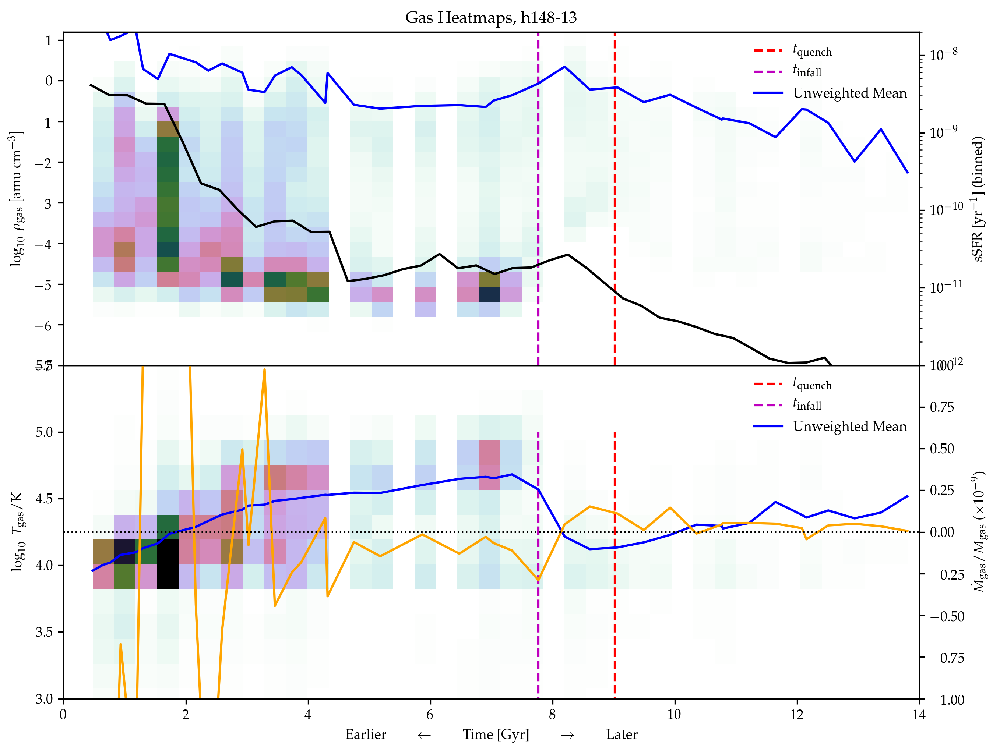

6.615051651809172
0.24724371941258383
4.490310274759903
2.6484989413945
4.513424943223161
-0.4822273853689101
0.2568463501085372
0.43347389052171614
1.5355367789813776


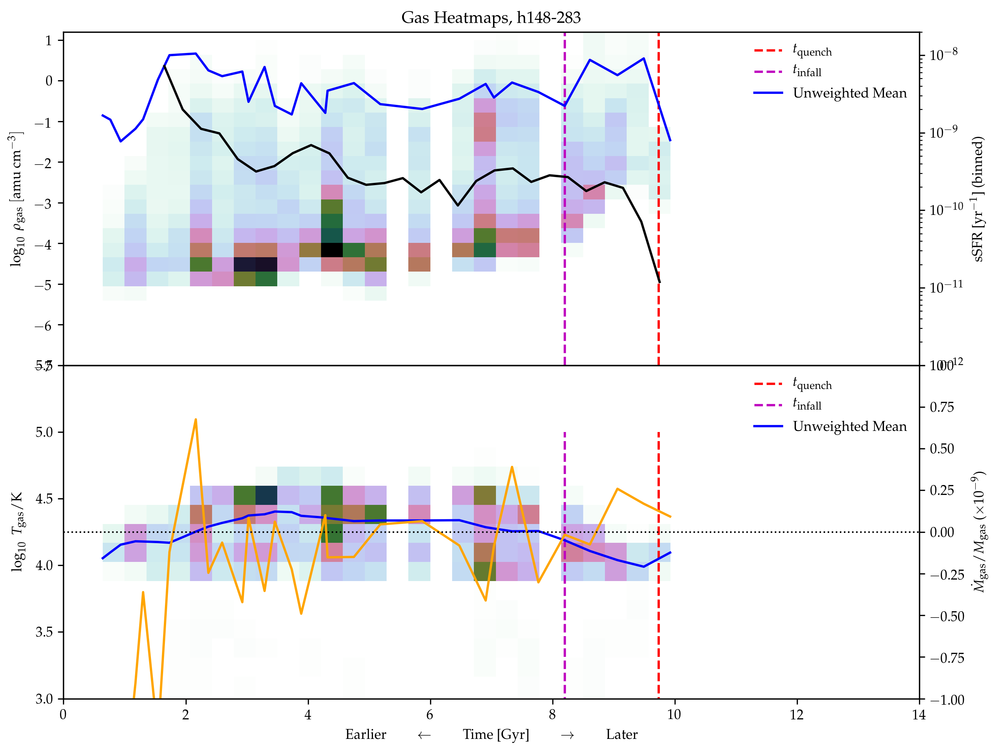

0.2536669899823565
Running for simulation h229
5.0467953506167404
4.405515937285795
1.2086642826085372


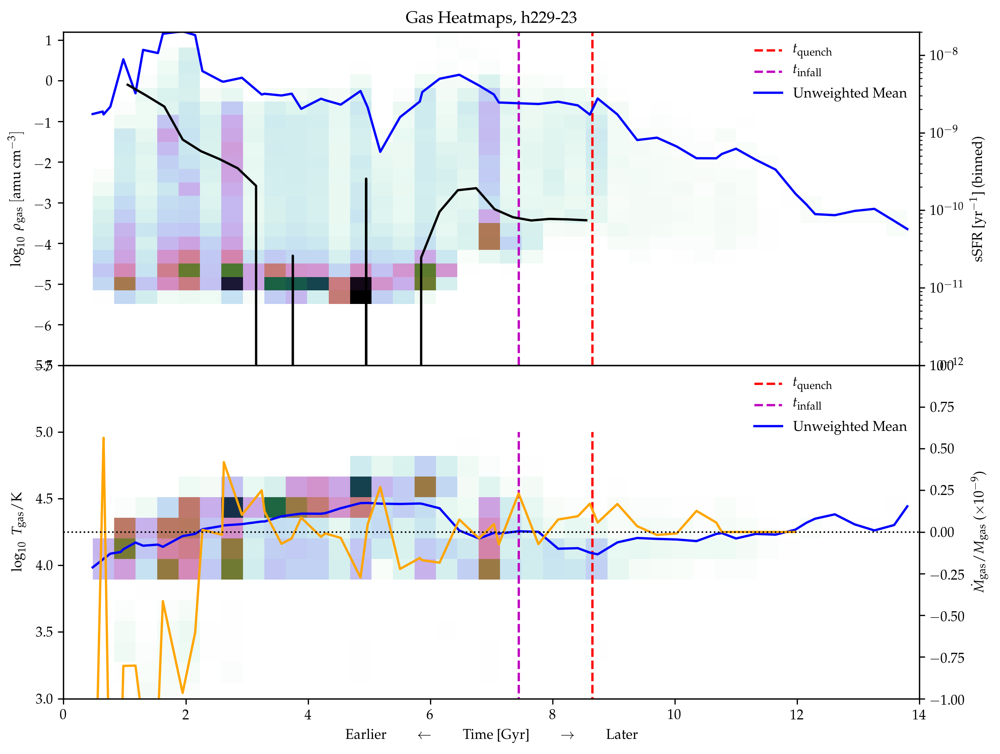

0.8157857691387891


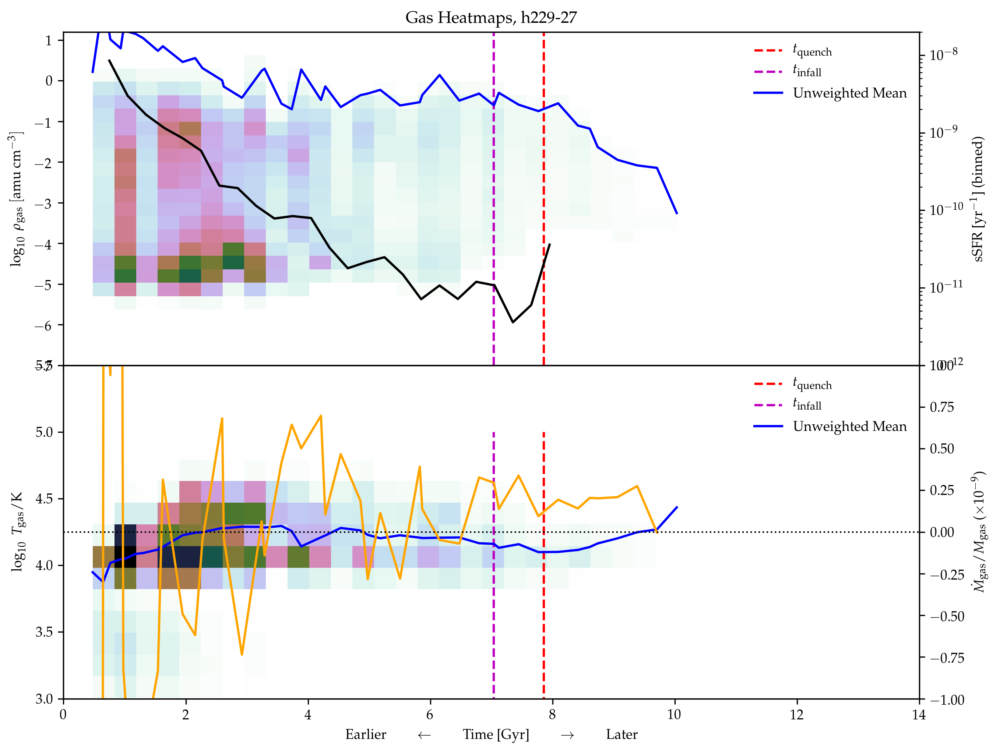

1.5814593738895653


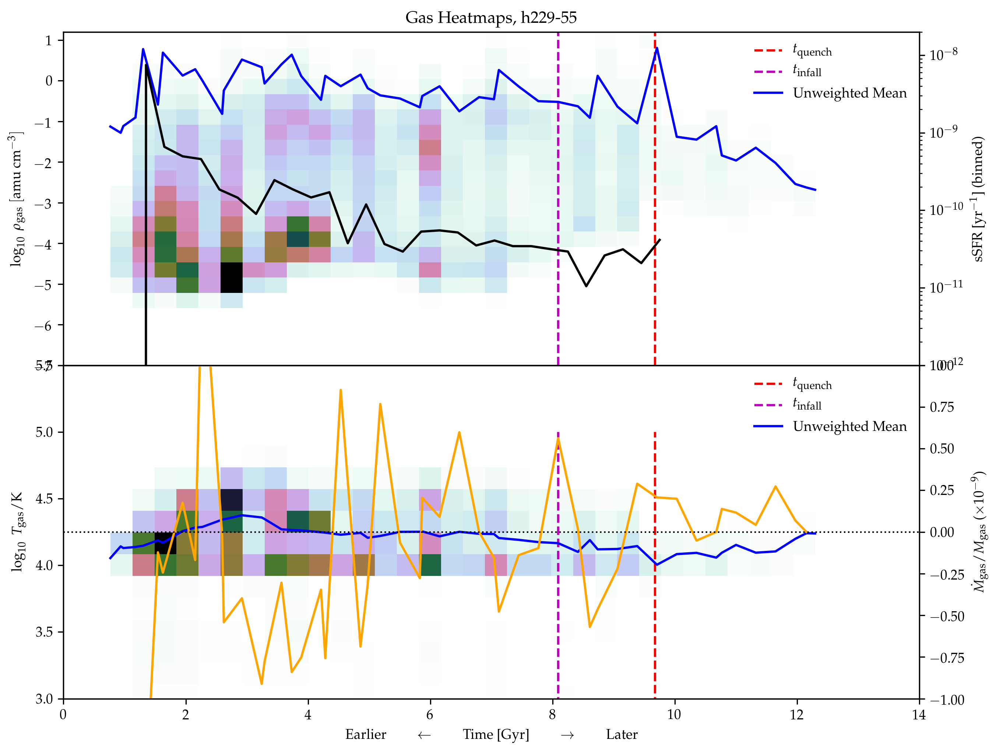

0.17155979397819898
-4.501837181484307
Running for simulation h242
2.4620975676685237
-1.572714633756508
0.9660740322292121


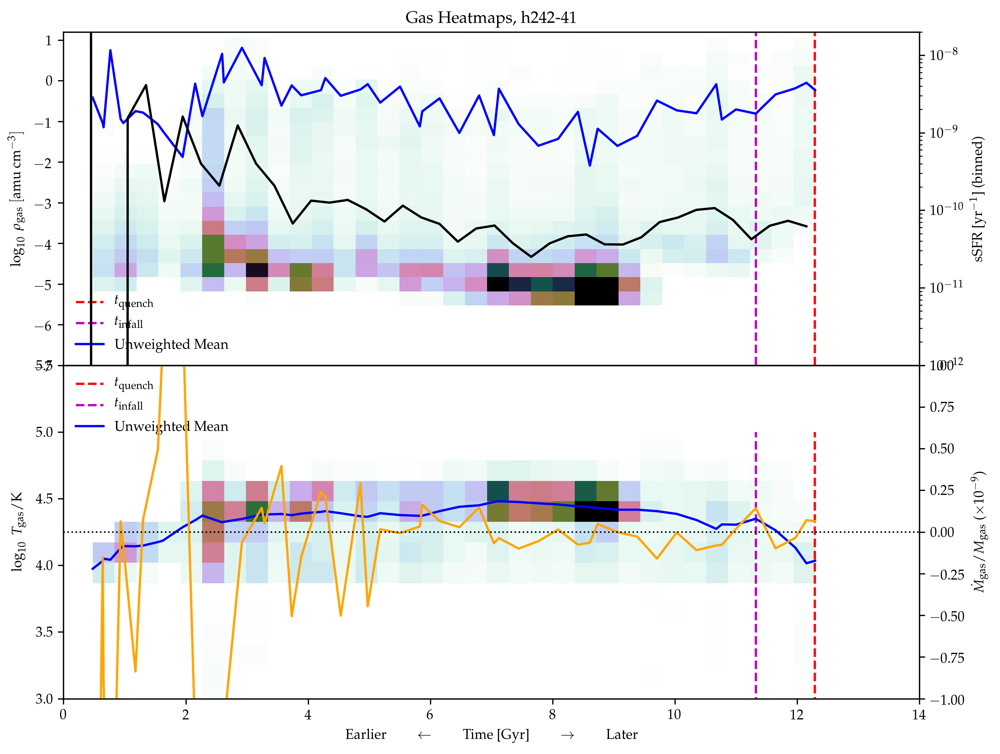

4.486484154813393
0.014378062984764739
Running for simulation h329
0.2763510204308375
0.0474482502200253


In [311]:
from scipy.stats import binned_statistic 

for sim in ['h148','h229','h242','h329']:
    data = read_timesteps(sim)
    z0 = read_z0(sim)
    print(f'Running for simulation {sim}')

    for haloid in haloids[sim]:
        d = data[data.z0haloid==haloid]

        # determine t_quench
        timescales = read_timescales()
        timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
        tquench_lbt = timescales.tquench.tolist()[0]
        tquench = 13.800797497330507 - tquench_lbt

        tinfall_lbt = timescales.tinfall.tolist()[0]
        tinfall = 13.800797497330507 - tinfall_lbt
        
        if np.isnan(tquench):
            continue
            
        timescale = tinfall_lbt - tquench_lbt
        print(timescale)
        
        if timescale < 0.5 or timescale > 2:
            continue
            

        z = z0[z0.haloid == haloid]
        sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
        bincenters = 0.5*(binEdges[1:] + binEdges[:-1])
        
        mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
        mstar = mstar[np.argsort(time)]
        time = np.sort(time)
        
        s = interpolate.InterpolatedUnivariateSpline(time, mstar)
        mstar_interpolated = s(bincenters)
        
        sSFR = sfh/mstar_interpolated
        bins = np.arange(0,13.8,0.3)
        sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
        bincenters_binned = 0.5*(bins[1:] + bins[:-1])
        
            
        outflow_disk = d.outflow_23
        inflow_disk = d.inflow_23
        net = outflow_disk + inflow_disk 
        net_norm = net / mgas

        # get distributions of gas density
        times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])
        
        for mgas in d.gas_mass:
            mgas_tot = np.append(mgas_tot, np.sum(mgas))
        mgas_tot = [np.sum(mgas) for mgas in d.gas_mass]
        
        for time, rho, mgas, a in zip(d.time, d.gas_rho, d.gas_mass, d.a):
            if len(rho) != 0:
                assert len(rho)==len(mgas)
                rhos = np.append(rhos, rho*(a**3))
                weights = np.append(weights,mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(rho))
                
        rhos = rhos / 2.453e7
        rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho]) # convert to amu/cc

        xbins = int((np.max(times) - np.min(times))/14 * 40)

        rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
        rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        # get distributions of gas temperature
        times, temps, weights = np.array([]), np.array([]), np.array([])
        for time, temp, mgas in zip(d.time, d.gas_temp, d.gas_mass):
            if len(temp) != 0:
                temps = np.append(temps, temp)
                weights = np.append(weights, mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(temp))

        temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp]

        temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
        temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

        ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

        if not np.isnan(tquench):
            ax[0].plot([tquench,tquench], [-10,10], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[0].plot([tinfall,tinfall], [-10,10], 'm--', label='$t_{\mathrm{infall}}$')

        im = ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, 
                          origin='lower', cmap='cubehelix_r', 
                          aspect='auto', vmin=0, vmax=0.02)
        ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
        ax[0].set_xlim(0, 14)
        ax[0].set_ylim(-7,1.2)
        ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')
        #fig.colorbar(im, ax=ax[0])
        
        ax0 = ax[0].twinx()
        ax0.plot(bincenters_binned, sSFR_binned, 'k-')
        ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
        ax0.semilogy()
        ax0.set_ylim(1e-12,2e-8)
        
        #ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[0].legend(frameon=False)

        if not np.isnan(tquench):
            ax[1].plot([tquench,tquench], [-10,5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[1].plot([tinfall,tinfall], [-10,5], 'm--', label='$t_{\mathrm{infall}}$')

        im = ax[1].imshow(temps_heatmap.T, extent=temps_extent, 
                          origin='lower', cmap='cubehelix_r', 
                          aspect='auto', vmin=0, vmax=0.04)
        ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
        ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
        ax[1].set_xlim(0,14)
        ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
        #ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[1].legend(frameon=False)
        ax[1].set_ylim(3,5.5)
        #fig.colorbar(im, ax=ax[1])
        
        ax1 = ax[1].twinx()
        ax1.plot(d.time, net_norm*1e9, color='orange')
        #ax1.plot(d.time, np.abs(inflow_disk), color='orange')
        ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
        ax1.set_ylim(-1,1)
        ax1.plot([0,14], [0,0], 'k:', linewidth=1)

        plt.subplots_adjust(hspace=0.)
        plt.savefig(f'plots/GasPlots/Group2/{sim}_{haloid}.png',dpi=300)
        plt.show()

# Star-forming, but have infell

Running for simulation h148


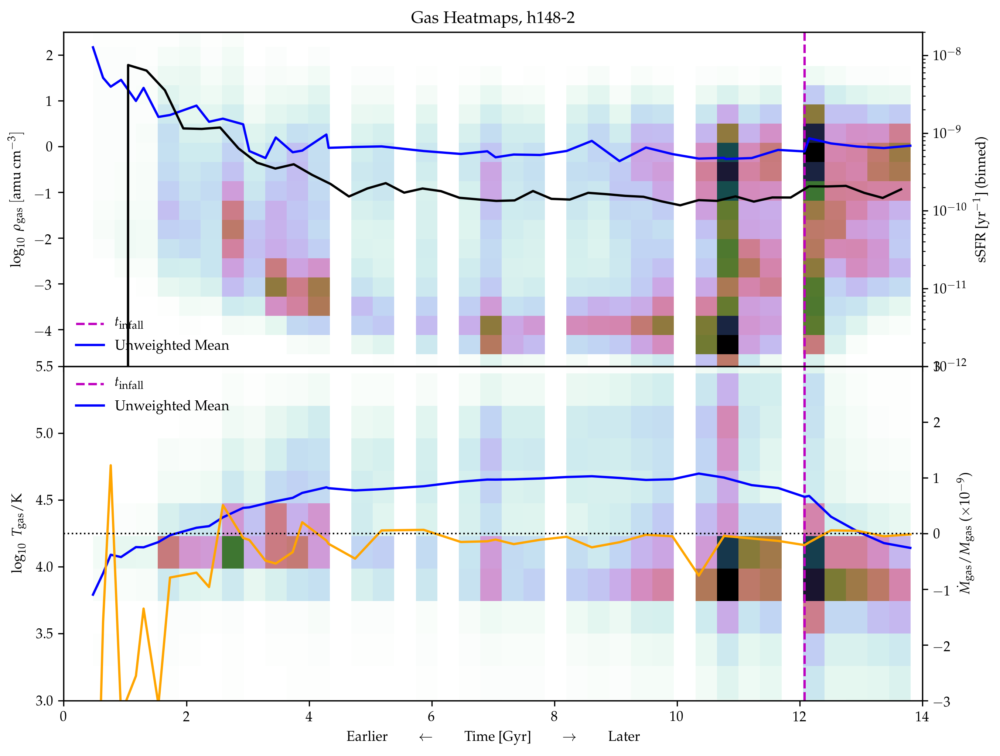

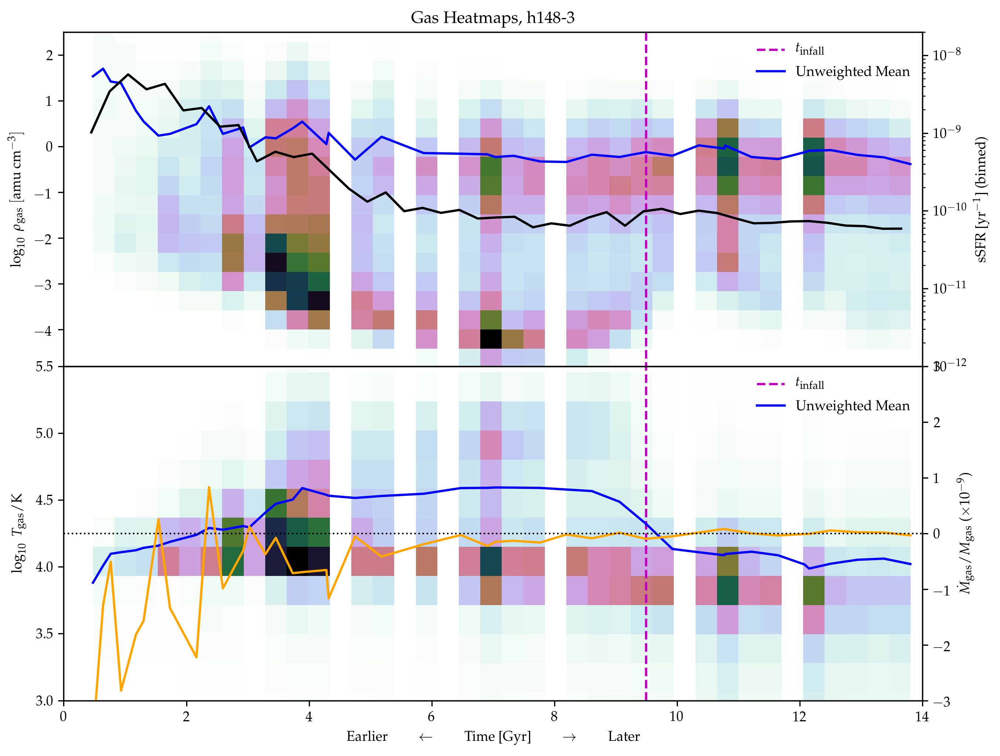

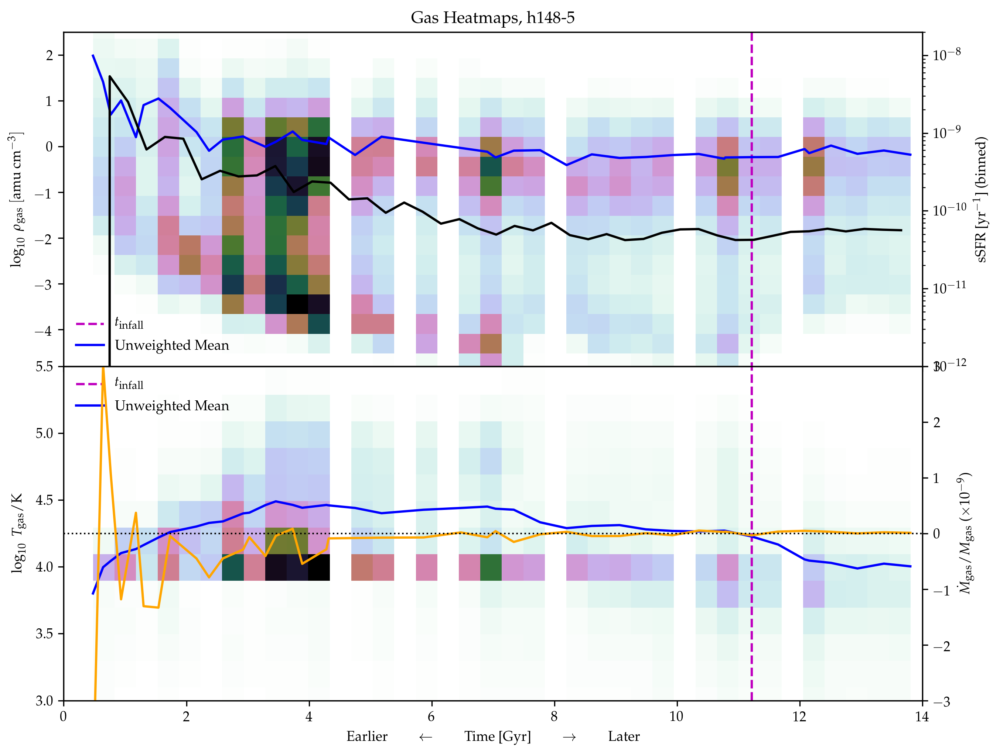

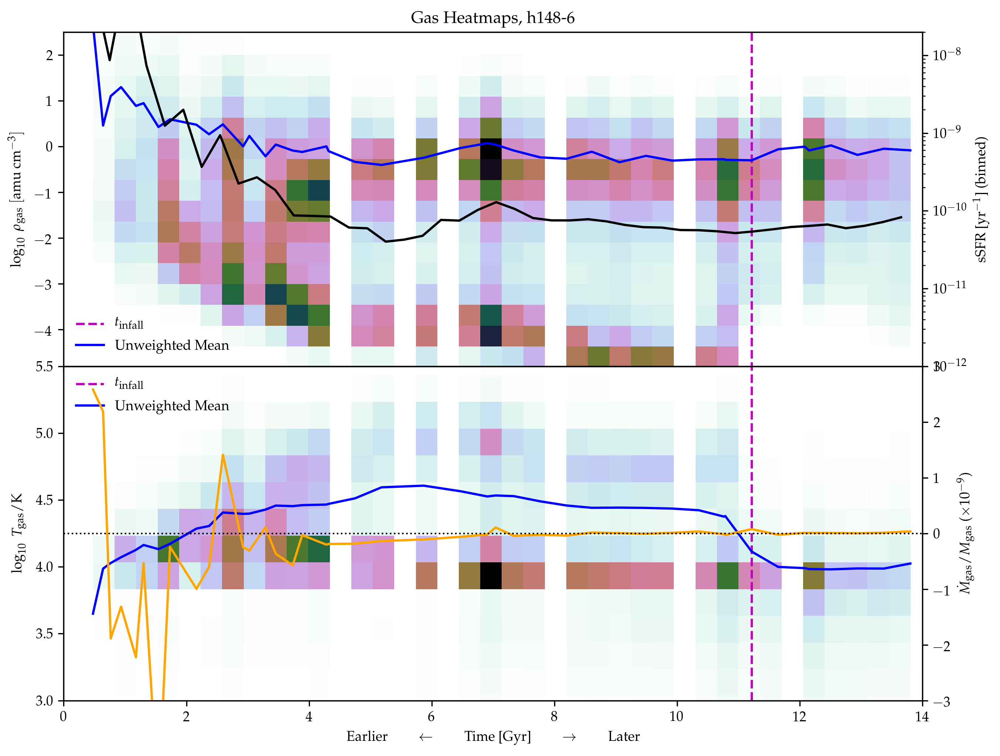

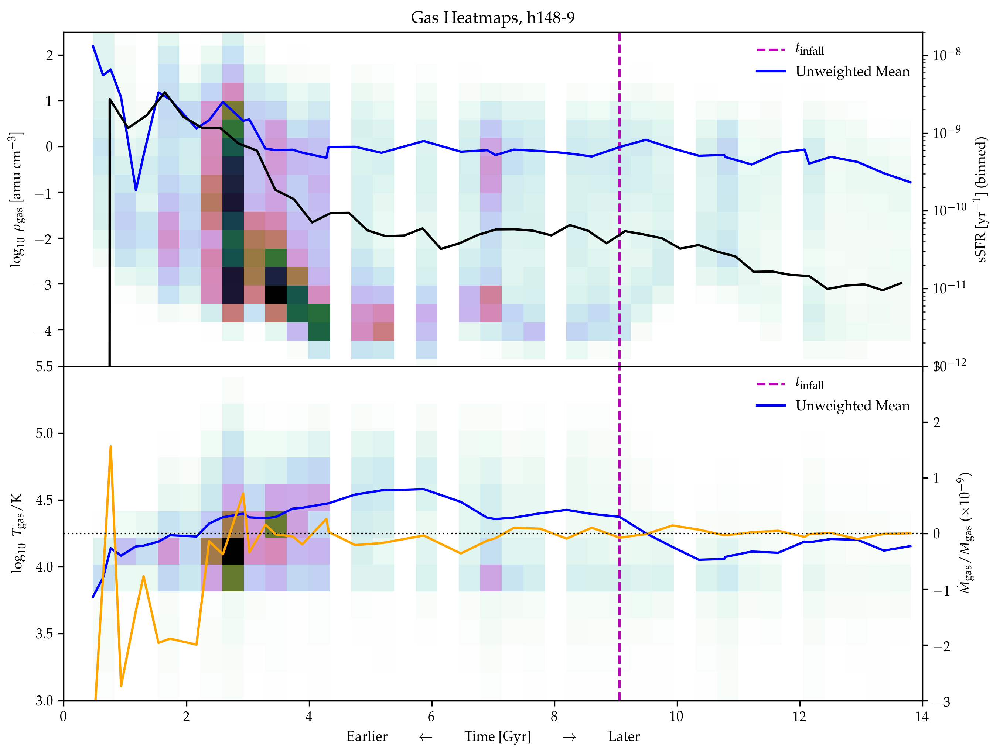

...

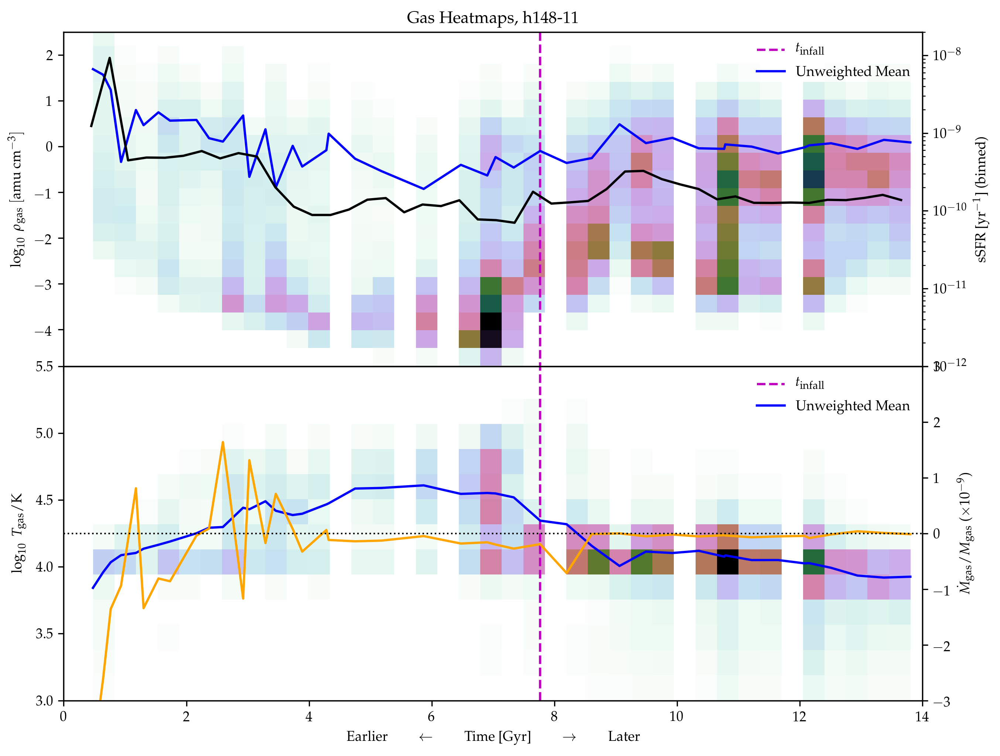

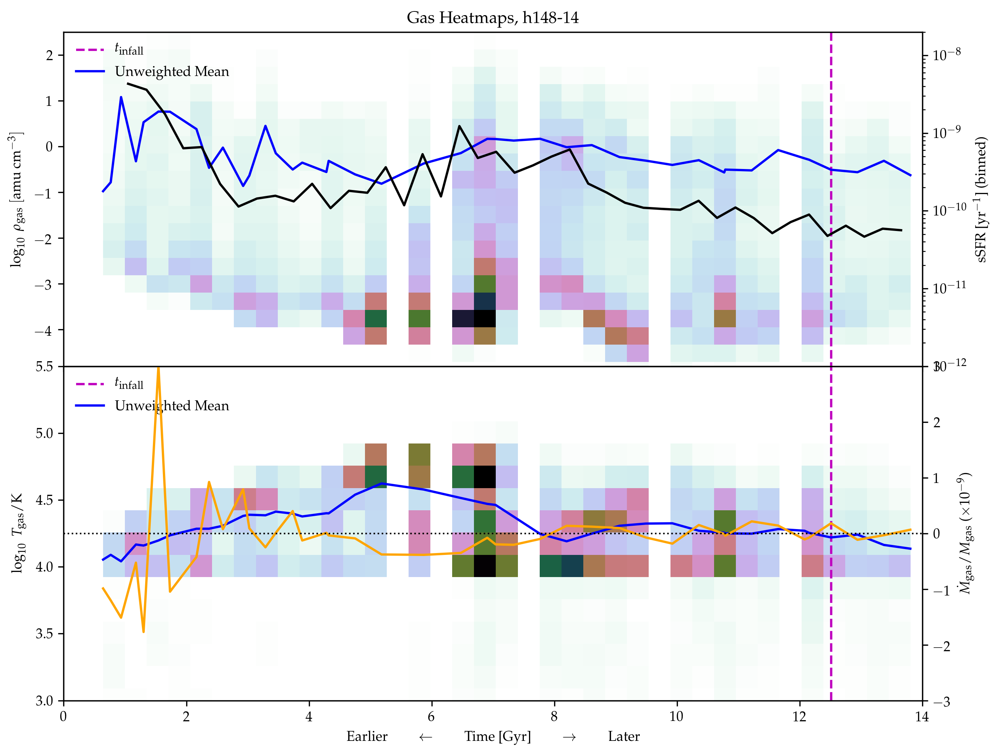

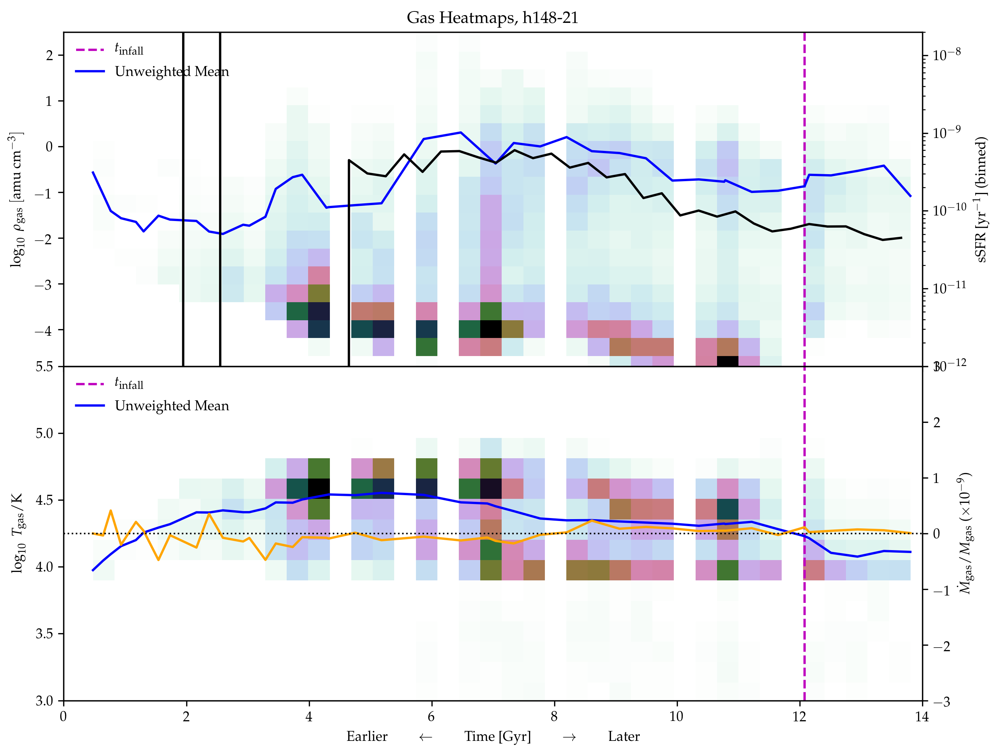

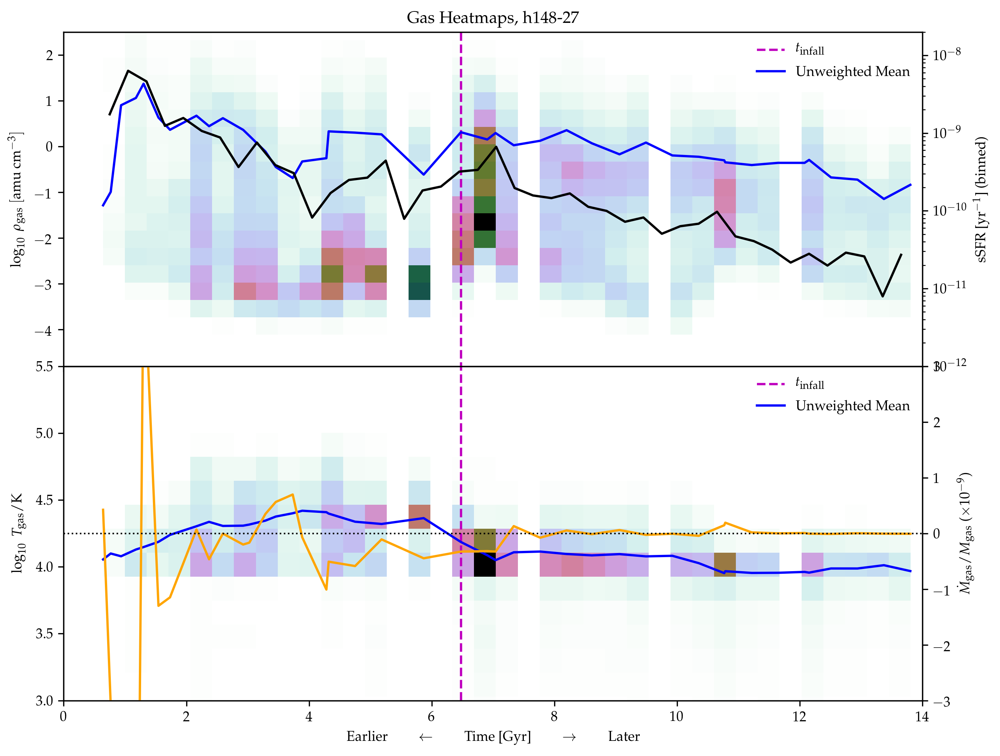

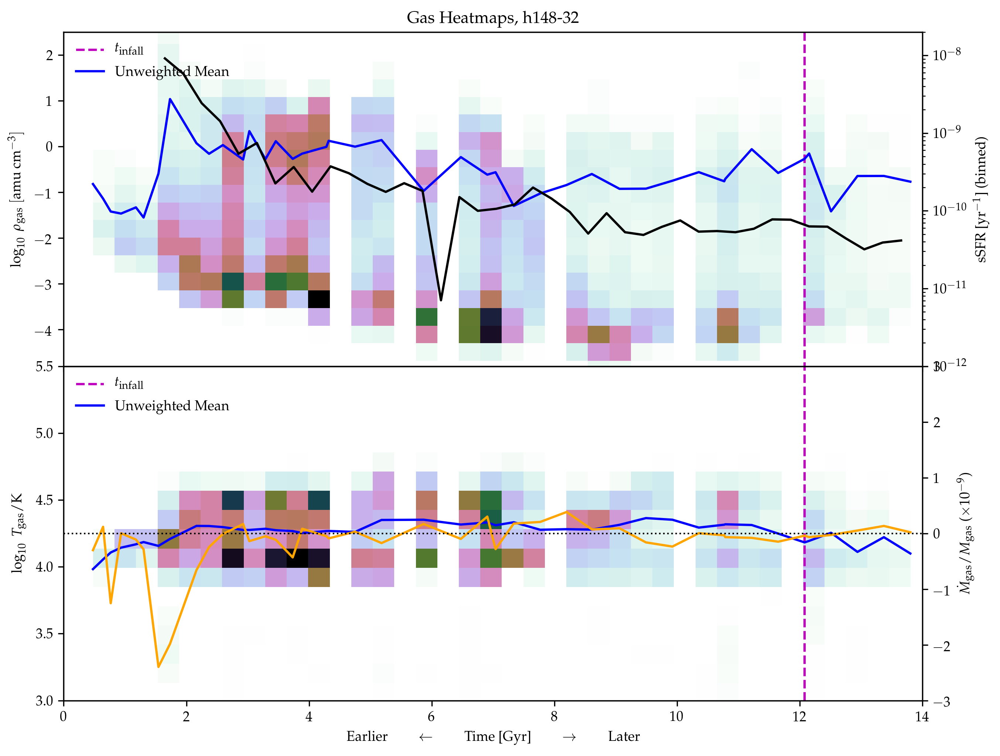

Running for simulation h229
Running for simulation h242


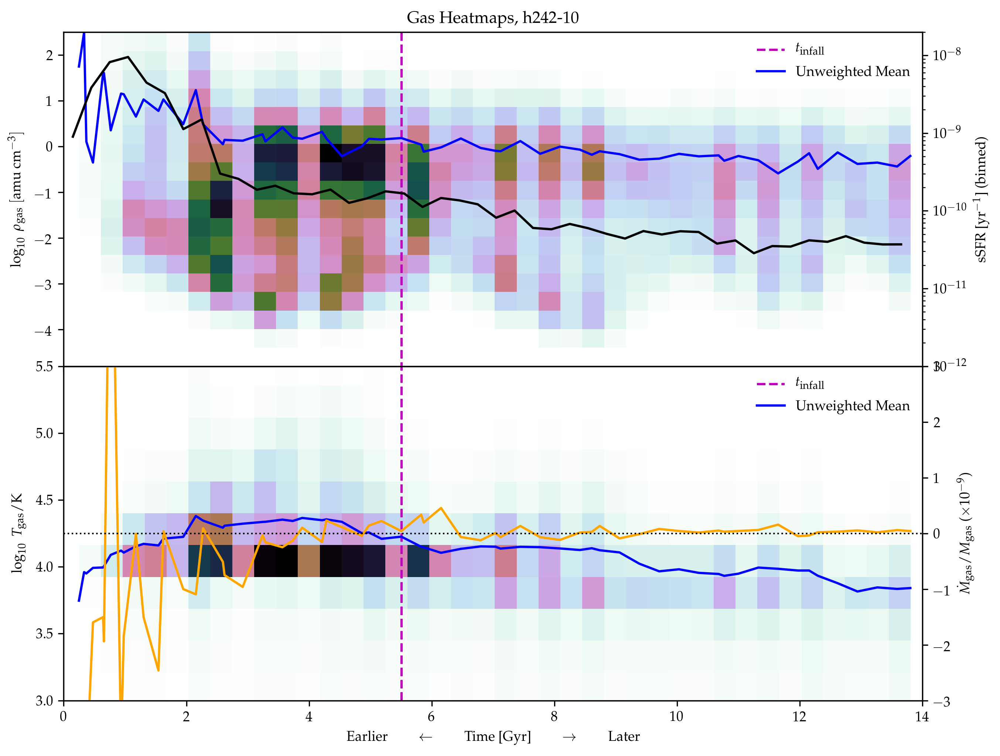

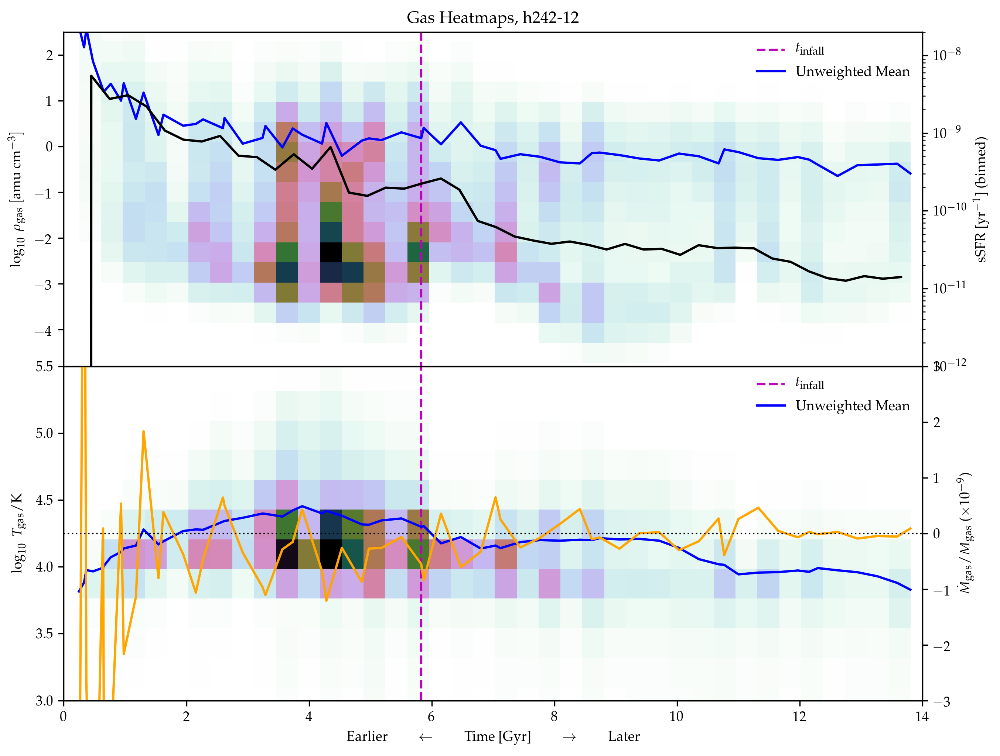

Running for simulation h329


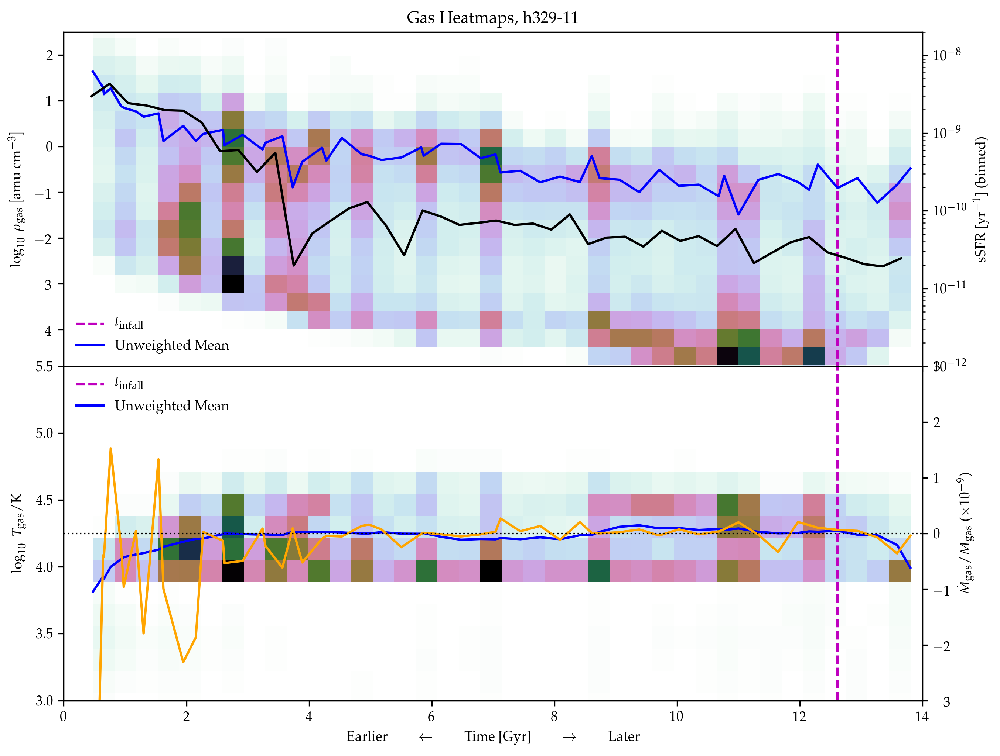

In [200]:
from scipy.stats import binned_statistic 

for sim in ['h148','h229','h242','h329']:
    data = read_timesteps(sim)
    z0 = read_z0(sim)
    print(f'Running for simulation {sim}')

    for haloid in haloids[sim]:
        d = data[data.z0haloid==haloid]

        # determine t_quench
        timescales = read_timescales()
        timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
        tquench_lbt = timescales.tquench.tolist()[0]
        tquench = 13.800797497330507 - tquench_lbt

        tinfall_lbt = timescales.tinfall.tolist()[0]
        tinfall = 13.800797497330507 - tinfall_lbt
        
        if not np.isnan(tquench):
            continue
            

        z = z0[z0.haloid == haloid]
        sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
        bincenters = 0.5*(binEdges[1:] + binEdges[:-1])
        
        mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
        mstar = mstar[np.argsort(time)]
        time = np.sort(time)
        
        s = interpolate.InterpolatedUnivariateSpline(time, mstar)
        mstar_interpolated = s(bincenters)
        
        sSFR = sfh/mstar_interpolated
        bins = np.arange(0,13.8,0.3)
        sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
        bincenters_binned = 0.5*(bins[1:] + bins[:-1])
        
            
        outflow_disk = d.outflow_23
        inflow_disk = d.inflow_23
        net = outflow_disk + inflow_disk 
        net_norm = net / mgas

        # get distributions of gas density
        times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])
        
        for mgas in d.gas_mass:
            mgas_tot = np.append(mgas_tot, np.sum(mgas))
        mgas_tot = [np.sum(mgas) for mgas in d.gas_mass]
        
        for time, rho, mgas in zip(d.time, d.gas_rho, d.gas_mass):
            if len(rho) != 0:
                assert len(rho)==len(mgas)
                rhos = np.append(rhos, rho)
                weights = np.append(weights,mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(rho))
                
        rhos = rhos / 2.453e7
        rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho]) # convert to amu/cc

        xbins = int((np.max(times) - np.min(times))/14 * 40)

        rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
        rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        # get distributions of gas temperature
        times, temps, weights = np.array([]), np.array([]), np.array([])
        for time, temp, mgas in zip(d.time, d.gas_temp, d.gas_mass):
            if len(temp) != 0:
                temps = np.append(temps, temp)
                weights = np.append(weights, mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(temp))

        temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp]

        temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
        temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

        ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

        if not np.isnan(tquench):
            ax[0].plot([tquench,tquench], [-4.8,2.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[0].plot([tinfall,tinfall], [-4.9,2.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
        ax[0].set_xlim(0, 14)
        ax[0].set_ylim(-4.8,2.5)
        ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')
        
        ax0 = ax[0].twinx()
        ax0.plot(bincenters_binned, sSFR_binned, 'k-')
        ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
        ax0.semilogy()
        ax0.set_ylim(1e-12,2e-8)
        
        #ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[0].legend(frameon=False)

        if not np.isnan(tquench):
            ax[1].plot([tquench,tquench], [3,5.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[1].plot([tinfall,tinfall], [3,5.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[1].imshow(temps_heatmap.T, extent=temps_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
        ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
        ax[1].set_xlim(0,14)
        ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
        #ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[1].legend(frameon=False)
        ax[1].set_ylim(3,5.5)
        
        ax1 = ax[1].twinx()
        ax1.plot(d.time, net_norm*1e9, color='orange')
        #ax1.plot(d.time, np.abs(inflow_disk), color='orange')
        ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
        ax1.set_ylim(-3,3)
        ax1.plot([0,14], [0,0], 'k:', linewidth=1)

        plt.subplots_adjust(hspace=0.)
        plt.savefig(f'plots/GasPlots/Group2/{sim}_{haloid}.png',dpi=300)
        plt.show()

# Quenched, w/ Quenching Timescale > 2 Gyr

Running for simulation h148
1.2497059915406208
6.615051651809172


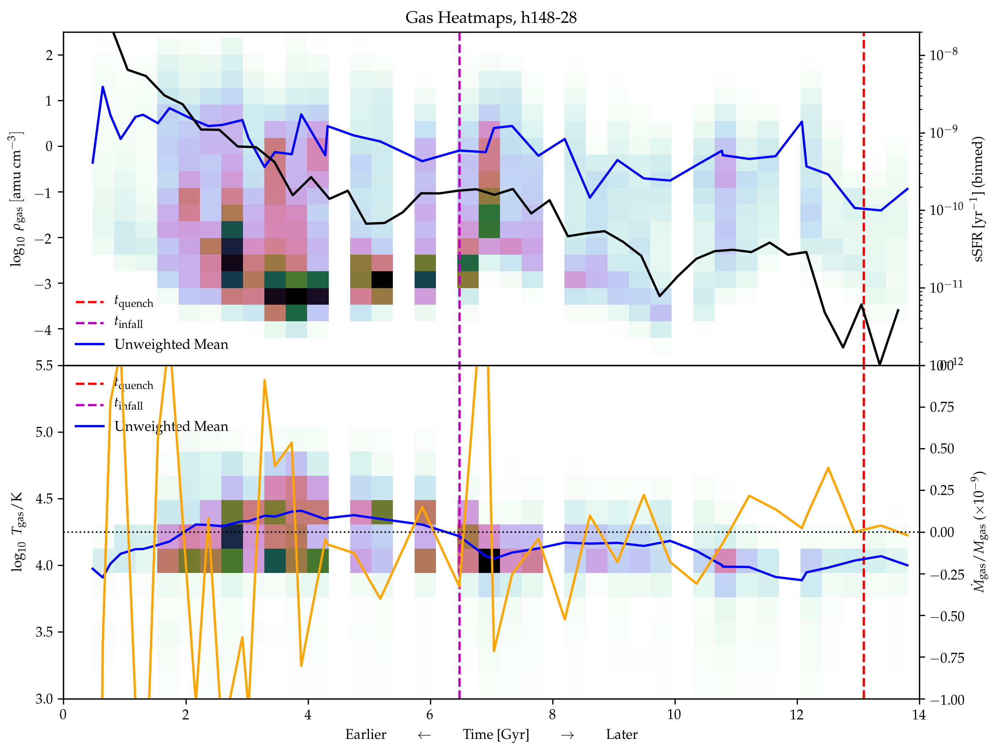

0.24724371941258383
4.490310274759903


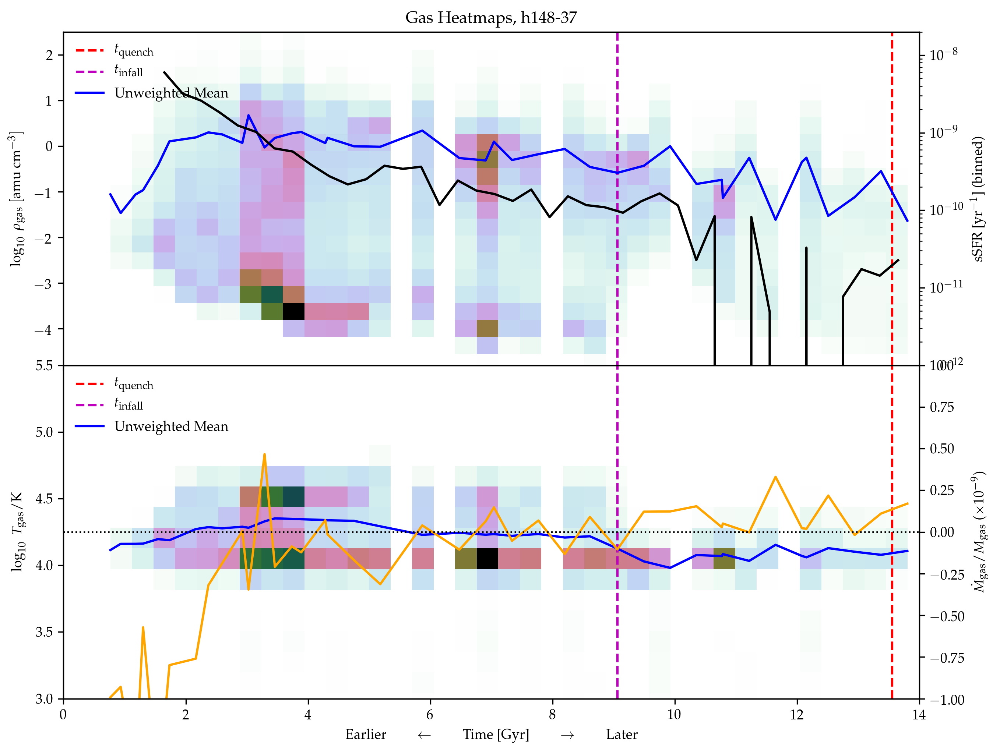

2.6484989413945


/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


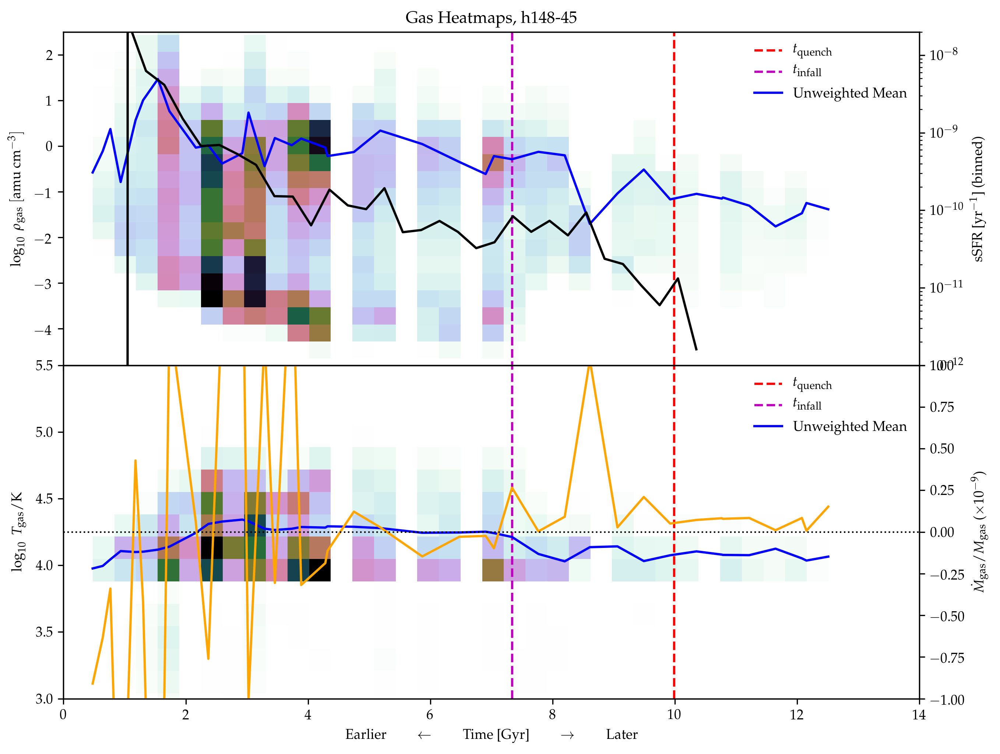

4.513424943223161


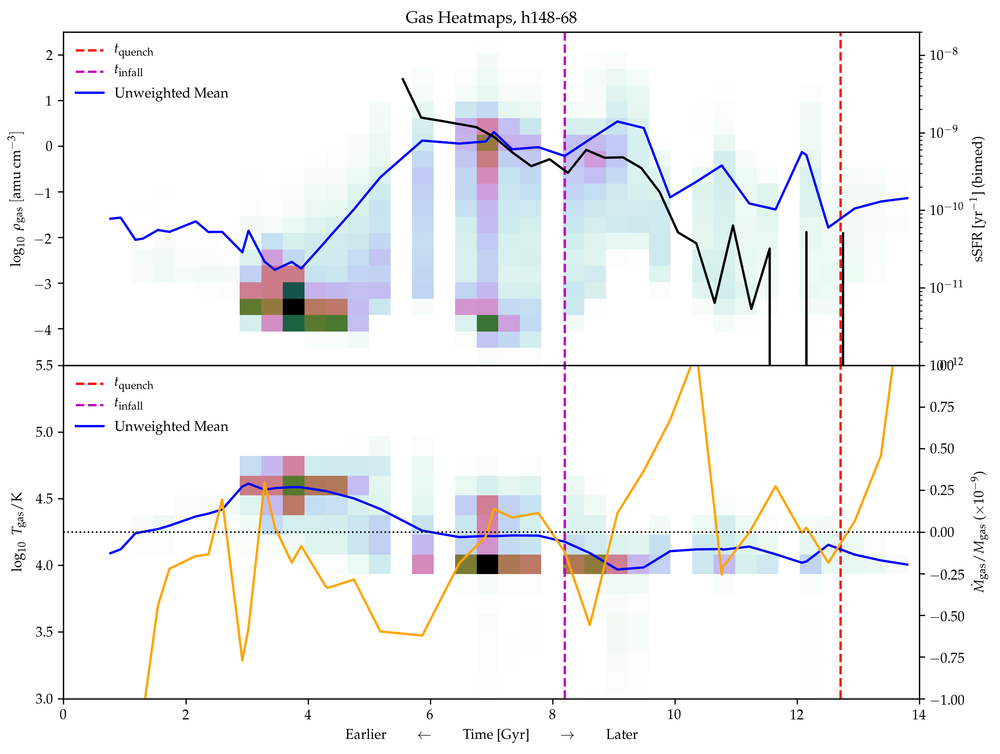

-0.4822273853689101
0.2568463501085372
0.43347389052171614
1.5355367789813776
0.2536669899823565
Running for simulation h229
5.0467953506167404


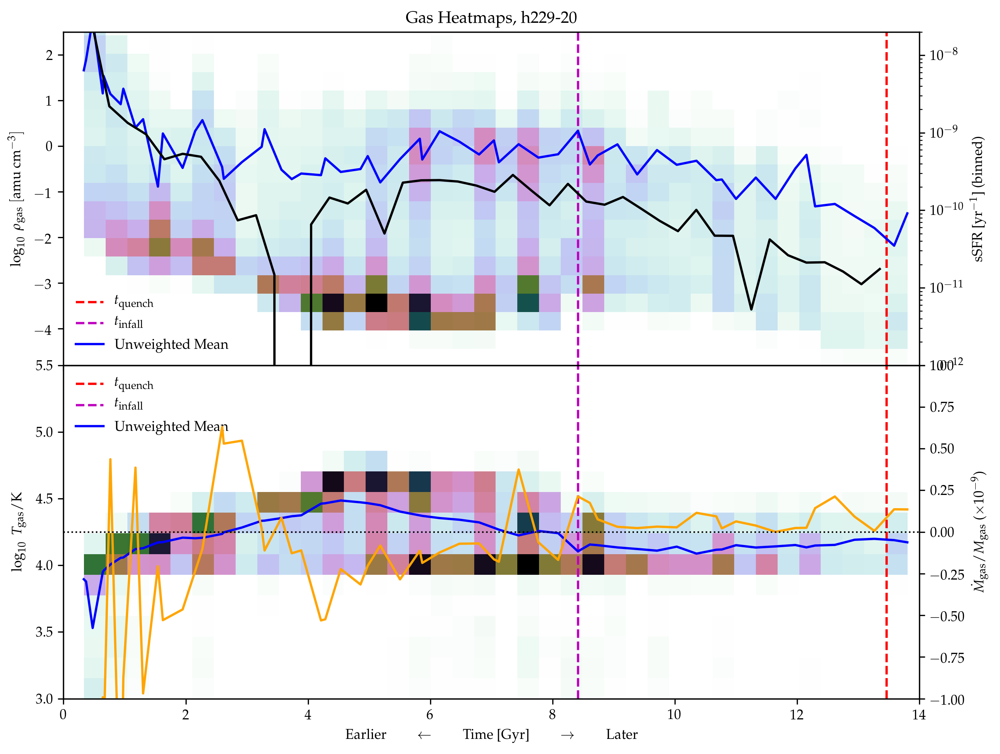

4.405515937285795


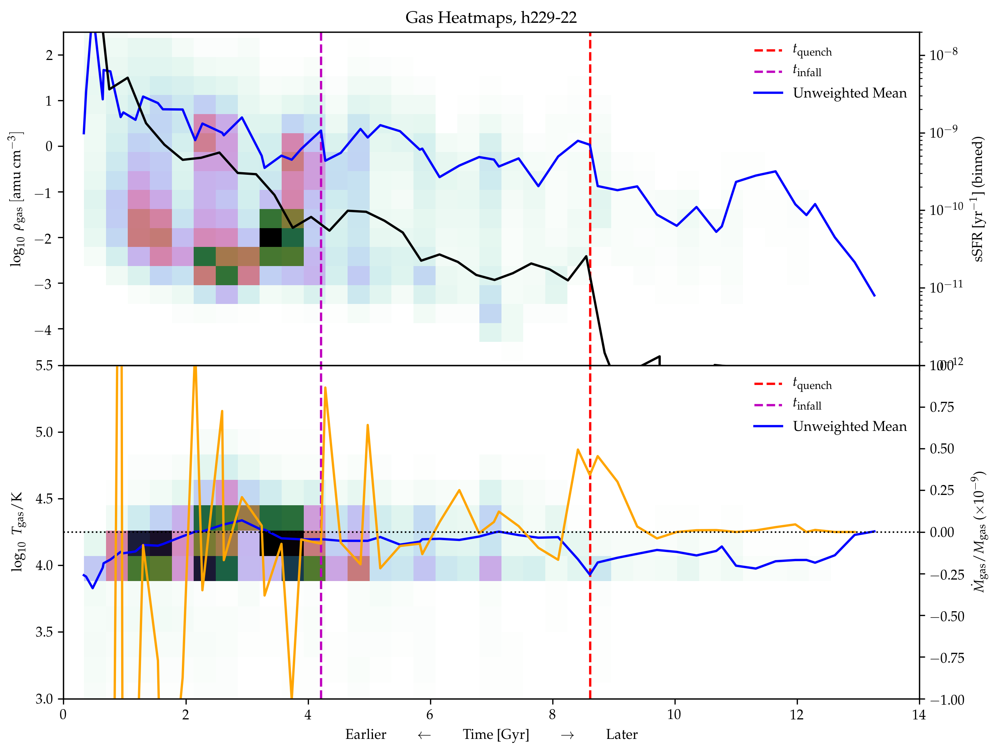

1.2086642826085372
0.8157857691387891
1.5814593738895653
0.17155979397819898
-4.501837181484307
Running for simulation h242
2.4620975676685237


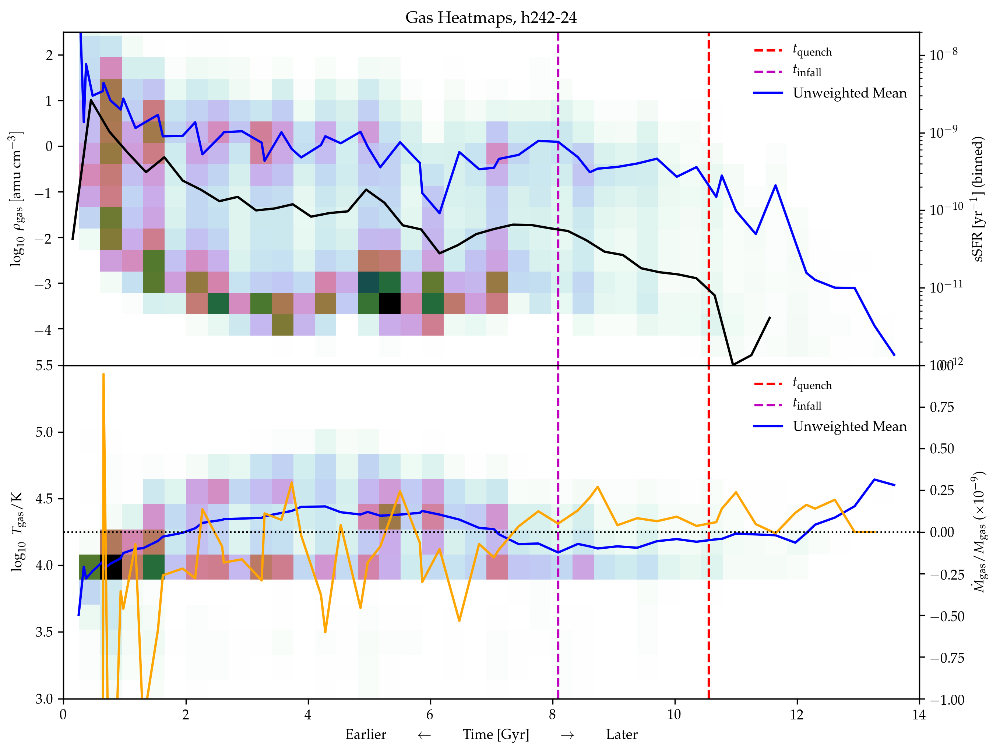

-1.572714633756508
0.9660740322292121
4.486484154813393


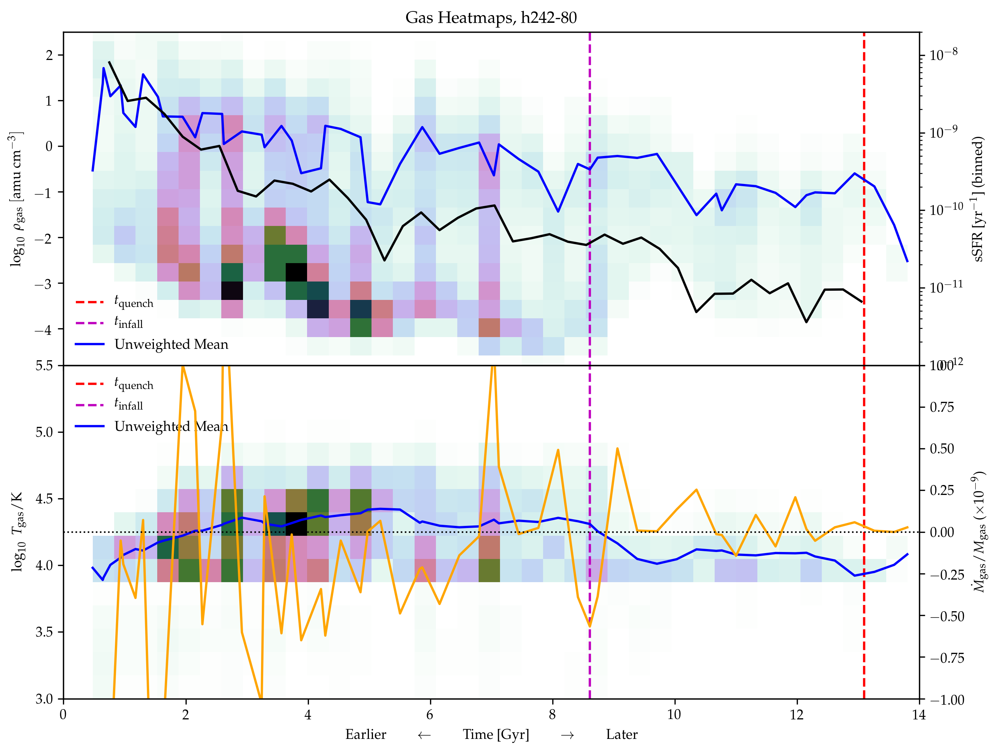

0.014378062984764739
Running for simulation h329
0.2763510204308375
0.0474482502200253


In [296]:
from scipy.stats import binned_statistic 

for sim in ['h148','h229','h242','h329']:
    data = read_timesteps(sim)
    z0 = read_z0(sim)
    print(f'Running for simulation {sim}')

    for haloid in haloids[sim]:
        d = data[data.z0haloid==haloid]

        # determine t_quench
        timescales = read_timescales()
        timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
        tquench_lbt = timescales.tquench.tolist()[0]
        tquench = 13.800797497330507 - tquench_lbt

        tinfall_lbt = timescales.tinfall.tolist()[0]
        tinfall = 13.800797497330507 - tinfall_lbt
        
        if np.isnan(tquench):
            continue
            
        timescale = tinfall_lbt - tquench_lbt
        print(timescale)
        
        if timescale < 2:
            continue
            

        z = z0[z0.haloid == haloid]
        sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
        bincenters = 0.5*(binEdges[1:] + binEdges[:-1])
        
        mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
        mstar = mstar[np.argsort(time)]
        time = np.sort(time)
        
        s = interpolate.InterpolatedUnivariateSpline(time, mstar)
        mstar_interpolated = s(bincenters)
        
        sSFR = sfh/mstar_interpolated
        bins = np.arange(0,13.8,0.3)
        sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
        bincenters_binned = 0.5*(bins[1:] + bins[:-1])
        
            
        outflow_disk = d.outflow_23
        inflow_disk = d.inflow_23
        net = outflow_disk + inflow_disk 
        net_norm = net / mgas

        # get distributions of gas density
        times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])
        
        for mgas in d.gas_mass:
            mgas_tot = np.append(mgas_tot, np.sum(mgas))
        mgas_tot = [np.sum(mgas) for mgas in d.gas_mass]
        
        for time, rho, mgas in zip(d.time, d.gas_rho, d.gas_mass):
            if len(rho) != 0:
                assert len(rho)==len(mgas)
                rhos = np.append(rhos, rho)
                weights = np.append(weights,mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(rho))
                
        rhos = rhos / 2.453e7
        rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho]) # convert to amu/cc

        xbins = int((np.max(times) - np.min(times))/14 * 40)

        rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
        rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        # get distributions of gas temperature
        times, temps, weights = np.array([]), np.array([]), np.array([])
        for time, temp, mgas in zip(d.time, d.gas_temp, d.gas_mass):
            if len(temp) != 0:
                temps = np.append(temps, temp)
                weights = np.append(weights, mgas/np.sum(mgas_tot))
                times = np.append(times, [time]*len(temp))

        temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp]

        temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
        temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

        ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

        if not np.isnan(tquench):
            ax[0].plot([tquench,tquench], [-4.8,2.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[0].plot([tinfall,tinfall], [-4.9,2.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
        ax[0].set_xlim(0, 14)
        ax[0].set_ylim(-4.8,2.5)
        ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')
        
        ax0 = ax[0].twinx()
        ax0.plot(bincenters_binned, sSFR_binned, 'k-')
        ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
        ax0.semilogy()
        ax0.set_ylim(1e-12,2e-8)
        
        #ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[0].legend(frameon=False)

        if not np.isnan(tquench):
            ax[1].plot([tquench,tquench], [3,5.5], 'r--', label='$t_{\mathrm{quench}}$')
        if not np.isnan(tinfall):
            ax[1].plot([tinfall,tinfall], [3,5.5], 'm--', label='$t_{\mathrm{infall}}$')

        ax[1].imshow(temps_heatmap.T, extent=temps_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
        ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
        ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
        ax[1].set_xlim(0,14)
        ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
        #ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
        ax[1].legend(frameon=False)
        ax[1].set_ylim(3,5.5)
        
        ax1 = ax[1].twinx()
        ax1.plot(d.time, net_norm*1e9, color='orange')
        #ax1.plot(d.time, np.abs(inflow_disk), color='orange')
        ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
        ax1.set_ylim(-1,1)
        ax1.plot([0,14], [0,0], 'k:', linewidth=1)

        plt.subplots_adjust(hspace=0.)
        plt.savefig(f'plots/GasPlots/Group2/{sim}_{haloid}.png',dpi=300)
        plt.show()

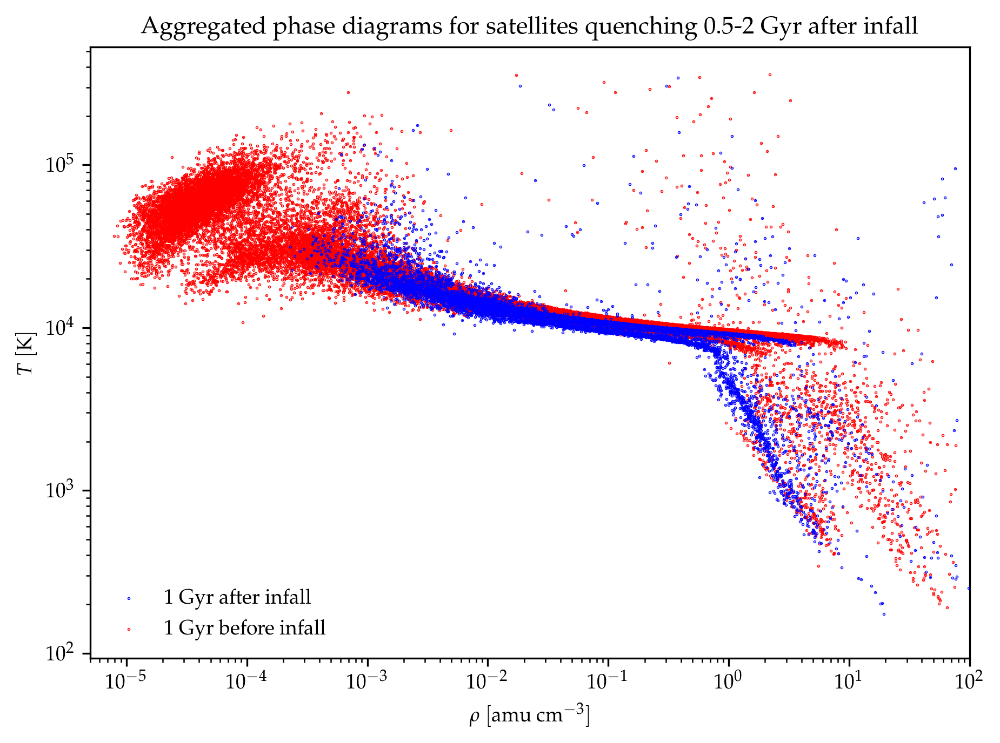

In [293]:
sims = ['h148', 'h148', 'h242', 'h229', 'h229', 'h229'] # these are the halos that take between 0.5 and 2 Gyr after infall to quench
ids = [13, 283, 41, 23, 27, 55]

rhos_minus1, temps_minus1, rhos_plus1, temps_plus1 = np.array([]), np.array([]), np.array([]), np.array([])

for sim, i in zip(sims,ids):
    data = read_timescales()
    data = data[(data.sim == sim)&(data.haloid==i)]
    tquench_lbt = data.tquench.tolist()[0]
    tquench = 13.800797497330507 - tquench_lbt

    tinfall_lbt = data.tinfall.tolist()[0]
    tinfall = 13.800797497330507 - tinfall_lbt

    data = read_timesteps(sim)
    data = data[data.z0haloid==i]
    time = np.array(data.time,dtype=float)
    infall_plus1 = np.argmin(np.abs(time-tinfall-1)) # index of timestep that is closest to 1 Gyr after infall
    infall_minus1 = np.argmin(np.abs(time-tinfall+1)) # index of timestep that is closest to 1 Gyr after infall

    rhos = data.gas_rho.tolist()
    temps = data.gas_temp.tolist()

    rho_minus1 = rhos[infall_minus1]/2.453e+7
    temp_minus1 = temps[infall_minus1]
    rho_plus1 = rhos[infall_plus1]/2.453e+7
    temp_plus1 = temps[infall_plus1]
    
    rhos_minus1 = np.append(rhos_minus1, rho_minus1)
    temps_minus1 = np.append(temps_minus1, temp_minus1)
    rhos_plus1 = np.append(rhos_plus1, rho_plus1)
    temps_plus1 = np.append(temps_plus1, temp_plus1)
    

plt.figure(dpi=300,figsize=(7,5))
plt.scatter(rhos_plus1,temps_plus1, c='b', s=0.1, zorder=10, label='1 Gyr after infall')
plt.scatter(rhos_minus1, temps_minus1, c='r', s=0.1, label='1 Gyr before infall')
plt.loglog()
plt.xlabel(r'$\rho$ $[\mathrm{amu~cm}^{-3}]$')
plt.ylabel(r'$T$ $[\mathrm{K}]$')
plt.xlim(5e-6,1e2)
plt.title('Aggregated phase diagrams for satellites quenching 0.5-2 Gyr after infall')
plt.legend(frameon=False)
plt.show()


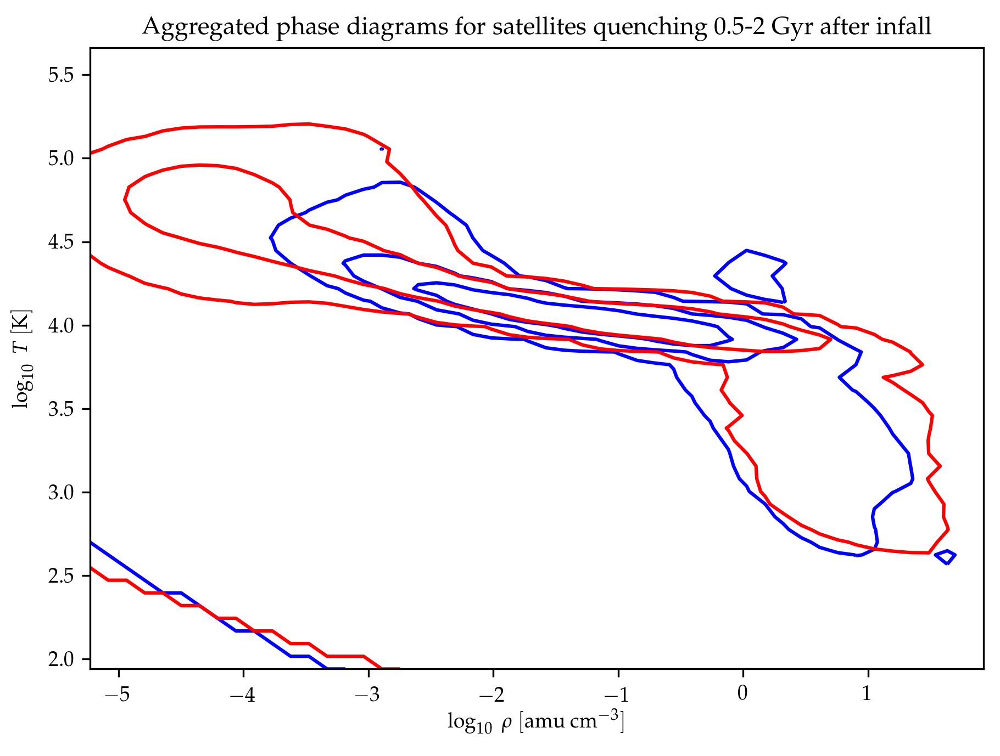

In [295]:
from scipy.stats import gaussian_kde

xmin, xmax = -5.301, 2
ymin, ymax = 1.903, 5.70
levels = [0, 0.01, 0.25, 1, 3.2]
#levels = 3

# fit an array of size [Ndim, Nsamples]
data = np.vstack([np.log10(rhos_plus1),np.log10(temps_plus1)])
kde = gaussian_kde(data)

# evaluate on a regular grid
xgrid = np.linspace(xmin, xmax,50)
ygrid = np.linspace(ymin, ymax,50)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))
image_plus1 = Z.reshape(Xgrid.shape)

# fit an array of size [Ndim, Nsamples]
data = np.vstack([np.log10(rhos_minus1),np.log10(temps_minus1)])
kde = gaussian_kde(data)

# evaluate on a regular grid
Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))
image_minus1 = Z.reshape(Xgrid.shape)

plt.figure(dpi=300,figsize=(7,5))

c1 = plt.contour(image_plus1,
           origin='lower', extent=[xmin,xmax,ymin,ymax],
           colors='blue', levels=levels)

c2 = plt.contour(image_minus1,
           origin='lower', extent=[xmin,xmax,ymin,ymax],
           colors='red', levels=levels)

plt.xlabel(r'$\log_{10}~\rho$ $[\mathrm{amu~cm}^{-3}]$')
plt.ylabel(r'$\log_{10}~T$ $[\mathrm{K}]$')
plt.title('Aggregated phase diagrams for satellites quenching 0.5-2 Gyr after infall')
plt.show()

# Checking the Potential AMIGA Issue

We know that AMIGA underestimates the virial radius of a satellite right after infall, since the halo environment is dense and it suddenly cannot use a standard 200 times the background density anymore. So, we need to adjust these calculations to fix the *comoving* virial radius at infall, i.e. we only allow the satellite's virial radius to change via the expansion of the universe. The below calculations check whether this significantly changes our results. 

In [321]:
haloids = {'h148': [2,3,5,6,9,10,11,13,14,21,27,28,32,36,37,45,68,80,163,278,283,329],
           'h229': [20, 22, 23, 27, 55, 73, 113],
           'h242': [10, 12, 24, 30, 41, 80, 439],
           'h329': [11, 33, 137]}

for sim in ['h329']:
    data = read_timesteps(sim)
    h = haloids[sim]
    

[ 11.  31.  33.  40.  64. 103. 133. 137. 146. 185.]


## Gas heatmap plot for h329-33, regular halo calculations

0.2763510204308375


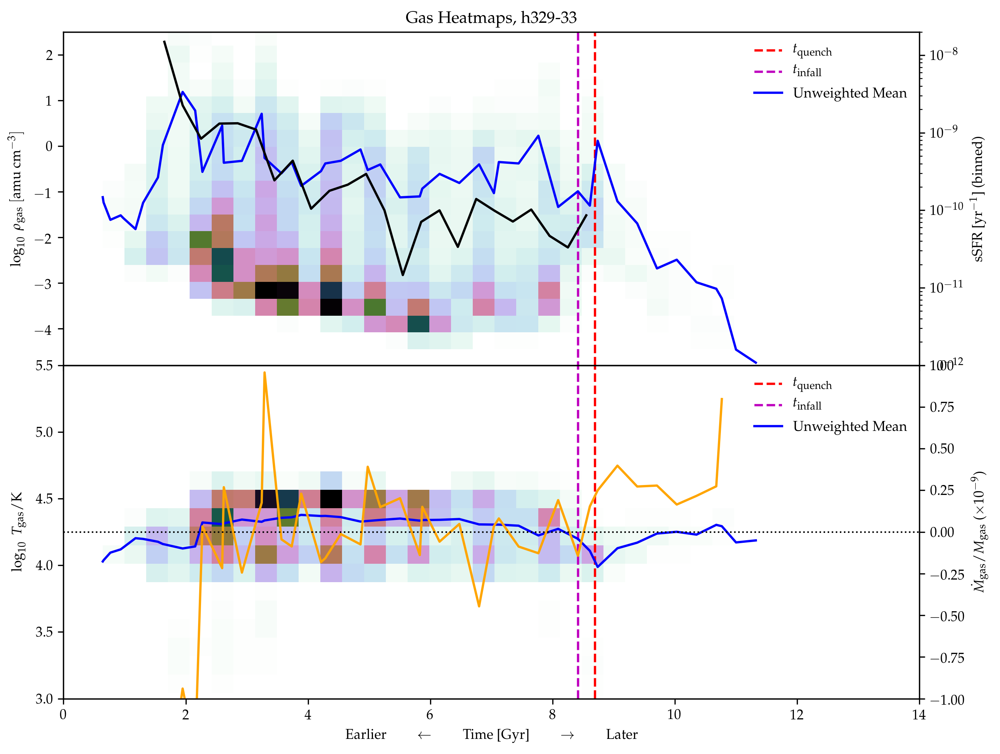

In [327]:

from scipy.stats import binned_statistic 

sim, haloid = 'h329', 33
    
data = read_timesteps(sim)
z0 = read_z0(sim)
d = data[data.z0haloid==haloid]

# determine t_quench
timescales = read_timescales()
timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
tquench_lbt = timescales.tquench.tolist()[0]
tquench = 13.800797497330507 - tquench_lbt

tinfall_lbt = timescales.tinfall.tolist()[0]
tinfall = 13.800797497330507 - tinfall_lbt


timescale = tinfall_lbt - tquench_lbt
print(timescale)

z = z0[z0.haloid == haloid]
sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
bincenters = 0.5*(binEdges[1:] + binEdges[:-1])

mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
mstar = mstar[np.argsort(time)]
time = np.sort(time)

s = interpolate.InterpolatedUnivariateSpline(time, mstar)
mstar_interpolated = s(bincenters)

sSFR = sfh/mstar_interpolated
bins = np.arange(0,13.8,0.3)
sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
bincenters_binned = 0.5*(bins[1:] + bins[:-1])


outflow_disk = d.outflow_23
inflow_disk = d.inflow_23
net = outflow_disk + inflow_disk 
net_norm = net / mgas

# get distributions of gas density
times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])

for mgas in d.gas_mass:
    mgas_tot = np.append(mgas_tot, np.sum(mgas))
mgas_tot = [np.sum(mgas) for mgas in d.gas_mass]

for time, rho, mgas in zip(d.time, d.gas_rho, d.gas_mass):
    if len(rho) != 0:
        assert len(rho)==len(mgas)
        rhos = np.append(rhos, rho)
        weights = np.append(weights,mgas/np.sum(mgas_tot))
        times = np.append(times, [time]*len(rho))

rhos = rhos / 2.453e7
rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho]) # convert to amu/cc

xbins = int((np.max(times) - np.min(times))/14 * 40)

rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

# get distributions of gas temperature
times, temps, weights = np.array([]), np.array([]), np.array([])
for time, temp, mgas in zip(d.time, d.gas_temp, d.gas_mass):
    if len(temp) != 0:
        temps = np.append(temps, temp)
        weights = np.append(weights, mgas/np.sum(mgas_tot))
        times = np.append(times, [time]*len(temp))

temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp]

temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

if not np.isnan(tquench):
    ax[0].plot([tquench,tquench], [-4.8,2.5], 'r--', label='$t_{\mathrm{quench}}$')
if not np.isnan(tinfall):
    ax[0].plot([tinfall,tinfall], [-4.9,2.5], 'm--', label='$t_{\mathrm{infall}}$')

ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
ax[0].set_xlim(0, 14)
ax[0].set_ylim(-4.8,2.5)
ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')

ax0 = ax[0].twinx()
ax0.plot(bincenters_binned, sSFR_binned, 'k-')
ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
ax0.semilogy()
ax0.set_ylim(1e-12,2e-8)

#ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
ax[0].legend(frameon=False)

if not np.isnan(tquench):
    ax[1].plot([tquench,tquench], [3,5.5], 'r--', label='$t_{\mathrm{quench}}$')
if not np.isnan(tinfall):
    ax[1].plot([tinfall,tinfall], [3,5.5], 'm--', label='$t_{\mathrm{infall}}$')

ax[1].imshow(temps_heatmap.T, extent=temps_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
ax[1].set_xlim(0,14)
ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
#ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
ax[1].legend(frameon=False)
ax[1].set_ylim(3,5.5)

ax1 = ax[1].twinx()
ax1.plot(d.time, net_norm*1e9, color='orange')
#ax1.plot(d.time, np.abs(inflow_disk), color='orange')
ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
ax1.set_ylim(-1,1)
ax1.plot([0,14], [0,0], 'k:', linewidth=1)

plt.subplots_adjust(hspace=0.)
plt.savefig(f'plots/GasPlots/Group2/{sim}_{haloid}.png',dpi=300)
plt.show()

## Gas heatmap plot for h329-33, spherical rvir calculations

0.2763510204308375


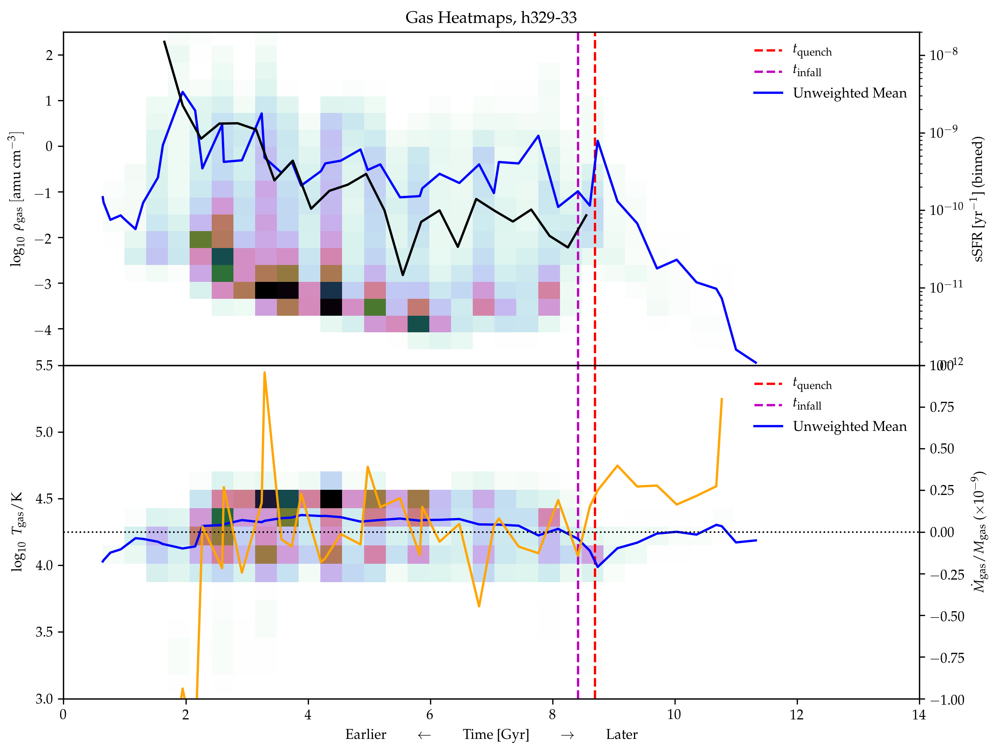

In [329]:

from scipy.stats import binned_statistic 

sim, haloid = 'h329', 33
    
data = read_timesteps(sim)
z0 = read_z0(sim)
d = data[data.z0haloid==haloid]

# determine t_quench
timescales = read_timescales()
timescales = timescales[(timescales.sim == sim) & (timescales.haloid==haloid)]
tquench_lbt = timescales.tquench.tolist()[0]
tquench = 13.800797497330507 - tquench_lbt

tinfall_lbt = timescales.tinfall.tolist()[0]
tinfall = 13.800797497330507 - tinfall_lbt


timescale = tinfall_lbt - tquench_lbt
print(timescale)

z = z0[z0.haloid == haloid]
sfh, binEdges = z.sfh.tolist()[0], z.sfhbins.tolist()[0]
bincenters = 0.5*(binEdges[1:] + binEdges[:-1])

mstar, mgas, time = np.array(d.mstar,dtype=float), np.array(d.mgas, dtype=float), np.array(d.time,dtype=float)
mstar = mstar[np.argsort(time)]
time = np.sort(time)

s = interpolate.InterpolatedUnivariateSpline(time, mstar)
mstar_interpolated = s(bincenters)

sSFR = sfh/mstar_interpolated
bins = np.arange(0,13.8,0.3)
sSFR_binned = binned_statistic(bincenters, sSFR, bins=bins).statistic
bincenters_binned = 0.5*(bins[1:] + bins[:-1])


outflow_disk = d.outflow_23
inflow_disk = d.inflow_23
net = outflow_disk + inflow_disk 
net_norm = net / mgas

# get distributions of gas density
times, rhos, weights, mgas_tot = np.array([]), np.array([]), np.array([]), np.array([])

for mgas in d.gas_mass_sphere:
    mgas_tot = np.append(mgas_tot, np.sum(mgas))
mgas_tot = [np.sum(mgas) for mgas in d.gas_mass_sphere]

for time, rho, mgas in zip(d.time, d.gas_rho_sphere, d.gas_mass_sphere):
    if len(rho) != 0:
        assert len(rho)==len(mgas)
        rhos = np.append(rhos, rho)
        weights = np.append(weights,mgas/np.sum(mgas_tot))
        times = np.append(times, [time]*len(rho))

rhos = rhos / 2.453e7
rho_mean = np.array([np.log10(np.mean(rho)/2.453e7) for rho in d.gas_rho_sphere]) # convert to amu/cc

xbins = int((np.max(times) - np.min(times))/14 * 40)

rhos_heatmap, xedges, yedges = np.histogram2d(times, np.log10(rhos), weights=weights,bins=(xbins,20))
rhos_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

# get distributions of gas temperature
times, temps, weights = np.array([]), np.array([]), np.array([])
for time, temp, mgas in zip(d.time, d.gas_temp_sphere, d.gas_mass_sphere):
    if len(temp) != 0:
        temps = np.append(temps, temp)
        weights = np.append(weights, mgas/np.sum(mgas_tot))
        times = np.append(times, [time]*len(temp))

temp_mean = [np.log10(np.mean(temp)) for temp in d.gas_temp_sphere]

temps_heatmap, xedges, yedges = np.histogram2d(times, np.log10(temps), weights=weights, bins=(xbins,20))
temps_extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

fig, ax = plt.subplots(2,1,dpi=300,figsize=(10,8),sharex=True)

ax[0].set_title(f'Gas Heatmaps, {sim}-{haloid}')

if not np.isnan(tquench):
    ax[0].plot([tquench,tquench], [-4.8,2.5], 'r--', label='$t_{\mathrm{quench}}$')
if not np.isnan(tinfall):
    ax[0].plot([tinfall,tinfall], [-4.9,2.5], 'm--', label='$t_{\mathrm{infall}}$')

ax[0].imshow(rhos_heatmap.T, extent=rhos_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
ax[0].set_ylabel(r'$\log_{10}~\rho_{\mathrm{gas}}$  $[\mathrm{amu}~\mathrm{cm}^{-3}]$')
ax[0].set_xlim(0, 14)
ax[0].set_ylim(-4.8,2.5)
ax[0].plot(d.time, rho_mean, 'b-', label='Unweighted Mean')

ax0 = ax[0].twinx()
ax0.plot(bincenters_binned, sSFR_binned, 'k-')
ax0.set_ylabel('sSFR [yr$^{-1}$] (binned)')
ax0.semilogy()
ax0.set_ylim(1e-12,2e-8)

#ax[0].plot(d.time, rho_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
ax[0].legend(frameon=False)

if not np.isnan(tquench):
    ax[1].plot([tquench,tquench], [3,5.5], 'r--', label='$t_{\mathrm{quench}}$')
if not np.isnan(tinfall):
    ax[1].plot([tinfall,tinfall], [3,5.5], 'm--', label='$t_{\mathrm{infall}}$')

ax[1].imshow(temps_heatmap.T, extent=temps_extent, origin='lower', cmap='cubehelix_r', aspect='auto')
ax[1].set_xlabel(r'Earlier $\qquad\leftarrow\qquad$ Time [Gyr] $\qquad\rightarrow\qquad$ Later')
ax[1].set_ylabel(r'$\log_{10}~T_{\mathrm{gas}} / \mathrm{K}$')
ax[1].set_xlim(0,14)
ax[1].plot(d.time, temp_mean, 'b-', label='Unweighted Mean')
#ax[1].plot(d.time, temp_mean_unw, 'b--', linewidth=0.5, label='Unweighted Mean')
ax[1].legend(frameon=False)
ax[1].set_ylim(3,5.5)

ax1 = ax[1].twinx()
ax1.plot(d.time, net_norm*1e9, color='orange')
#ax1.plot(d.time, np.abs(inflow_disk), color='orange')
ax1.set_ylabel(r'$\dot{M}_{\mathrm{gas}} / M_{\mathrm{gas}}$ ($\times 10^{-9}$)')
ax1.set_ylim(-1,1)
ax1.plot([0,14], [0,0], 'k:', linewidth=1)

plt.subplots_adjust(hspace=0.)
plt.savefig(f'plots/GasPlots/Group2/{sim}_{haloid}.png',dpi=300)
plt.show()

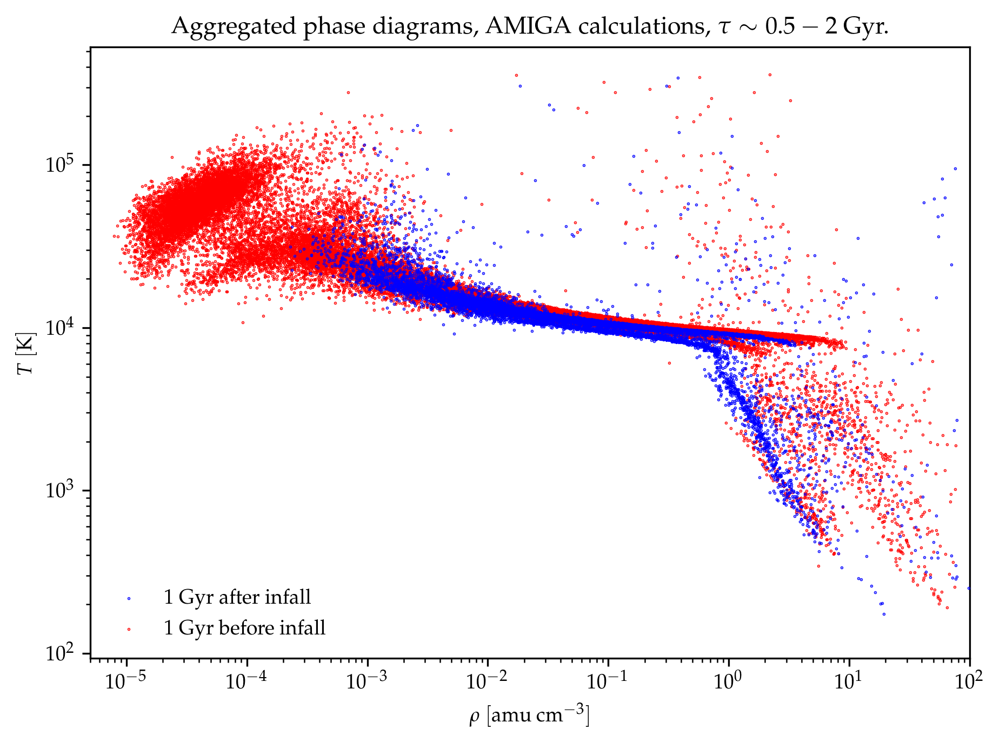

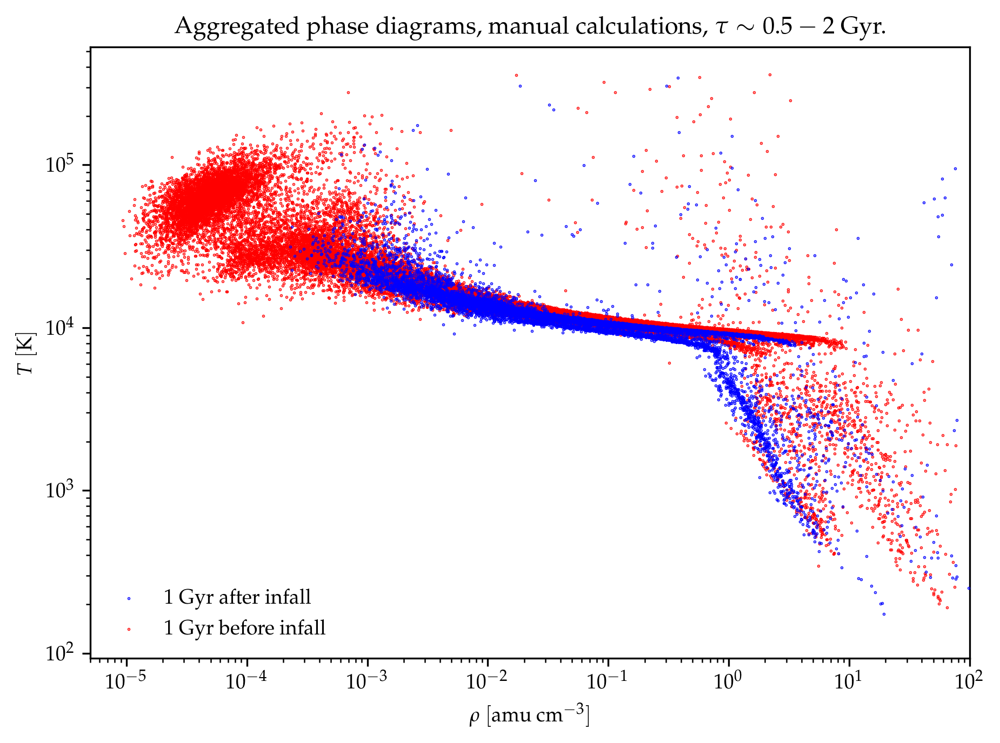

In [331]:
sims = ['h148', 'h148', 'h242', 'h229', 'h229', 'h229'] # these are the halos that take between 0.5 and 2 Gyr after infall to quench
ids = [13, 283, 41, 23, 27, 55]

rhos_minus1, temps_minus1, rhos_plus1, temps_plus1 = np.array([]), np.array([]), np.array([]), np.array([])

for sim, i in zip(sims,ids):
    data = read_timescales()
    data = data[(data.sim == sim)&(data.haloid==i)]
    tquench_lbt = data.tquench.tolist()[0]
    tquench = 13.800797497330507 - tquench_lbt

    tinfall_lbt = data.tinfall.tolist()[0]
    tinfall = 13.800797497330507 - tinfall_lbt

    data = read_timesteps(sim)
    data = data[data.z0haloid==i]
    time = np.array(data.time,dtype=float)
    infall_plus1 = np.argmin(np.abs(time-tinfall-1)) # index of timestep that is closest to 1 Gyr after infall
    infall_minus1 = np.argmin(np.abs(time-tinfall+1)) # index of timestep that is closest to 1 Gyr after infall

    rhos = data.gas_rho.tolist()
    temps = data.gas_temp.tolist()

    rho_minus1 = rhos[infall_minus1]/2.453e+7
    temp_minus1 = temps[infall_minus1]
    rho_plus1 = rhos[infall_plus1]/2.453e+7
    temp_plus1 = temps[infall_plus1]
    
    rhos_minus1 = np.append(rhos_minus1, rho_minus1)
    temps_minus1 = np.append(temps_minus1, temp_minus1)
    rhos_plus1 = np.append(rhos_plus1, rho_plus1)
    temps_plus1 = np.append(temps_plus1, temp_plus1)
    

plt.figure(dpi=300,figsize=(7,5))
plt.scatter(rhos_plus1,temps_plus1, c='b', s=0.1, zorder=10, label='1 Gyr after infall')
plt.scatter(rhos_minus1, temps_minus1, c='r', s=0.1, label='1 Gyr before infall')
plt.loglog()
plt.xlabel(r'$\rho$ $[\mathrm{amu~cm}^{-3}]$')
plt.ylabel(r'$T$ $[\mathrm{K}]$')
plt.xlim(5e-6,1e2)
plt.title(r'Aggregated phase diagrams, AMIGA calculations, $\tau \sim 0.5-2$ Gyr.')
plt.legend(frameon=False)
plt.show()

rhos_minus1, temps_minus1, rhos_plus1, temps_plus1 = np.array([]), np.array([]), np.array([]), np.array([])

for sim, i in zip(sims,ids):
    data = read_timescales()
    data = data[(data.sim == sim)&(data.haloid==i)]
    tquench_lbt = data.tquench.tolist()[0]
    tquench = 13.800797497330507 - tquench_lbt

    tinfall_lbt = data.tinfall.tolist()[0]
    tinfall = 13.800797497330507 - tinfall_lbt

    data = read_timesteps(sim)
    data = data[data.z0haloid==i]
    time = np.array(data.time,dtype=float)
    infall_plus1 = np.argmin(np.abs(time-tinfall-1)) # index of timestep that is closest to 1 Gyr after infall
    infall_minus1 = np.argmin(np.abs(time-tinfall+1)) # index of timestep that is closest to 1 Gyr after infall

    rhos = data.gas_rho_sphere.tolist()
    temps = data.gas_temp_sphere.tolist()

    rho_minus1 = rhos[infall_minus1]/2.453e+7
    temp_minus1 = temps[infall_minus1]
    rho_plus1 = rhos[infall_plus1]/2.453e+7
    temp_plus1 = temps[infall_plus1]
    
    rhos_minus1 = np.append(rhos_minus1, rho_minus1)
    temps_minus1 = np.append(temps_minus1, temp_minus1)
    rhos_plus1 = np.append(rhos_plus1, rho_plus1)
    temps_plus1 = np.append(temps_plus1, temp_plus1)
    

plt.figure(dpi=300,figsize=(7,5))
plt.scatter(rhos_plus1,temps_plus1, c='b', s=0.1, zorder=10, label='1 Gyr after infall')
plt.scatter(rhos_minus1, temps_minus1, c='r', s=0.1, label='1 Gyr before infall')
plt.loglog()
plt.xlabel(r'$\rho$ $[\mathrm{amu~cm}^{-3}]$')
plt.ylabel(r'$T$ $[\mathrm{K}]$')
plt.xlim(5e-6,1e2)
plt.title(r'Aggregated phase diagrams, manual calculations, $\tau \sim 0.5-2$ Gyr.')
plt.legend(frameon=False)
plt.show()
